#How can we predict NBA ticket price?

<img src="files/nba.jpg">

###by Bryan Baek, Walker Evans, and Takehiro Matsuzawa

In [3]:
%matplotlib inline
import numpy as np
import scipy as sp
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import pandas as pd
import time
pd.set_option('display.width', 500)
pd.set_option('display.max_columns', 100)
pd.set_option('display.notebook_repr_html', True)
import seaborn as sns
sns.set_style("whitegrid")
sns.set_context("poster")
from bs4 import BeautifulSoup
import requests
import html5lib
import datetime
import os
import time
import re

#I. Overview and Motivation:

Ticket prices are very volatile. The ticket themselves are priced based on supply and demand. Thus, without a sure way to price the tickets, the tickets are priced arbitrarily, and it's either priced higher or lower than the market demand. Thus, there is a deadweight loss associated with the trade of ticket prices. We see this happen a lot on third-party ticket website like Stubhub or SeatGeek. 

With this project, we attempted to gather, explore, and exploit ticket prices posted on Seatgeek.com and their relationship to sports data. SeatGeek is 3rd party website for tickets - users are able to buy/sell tickets for any sports/concerts. 

Thus, we wanted to look at how different factors affect the ticket pricing. 
1. What factors affect the ticket price at a given moment?
2. Using today's information, can we predict the ticket price a week from now?

We looked at NBA which is currently in season at the time of the project. We used SeatGeek's API to pull information about an event's ticket information. Unfortunately, due to the API policy, we were not able to scrape the information about individual tickets. Next, we scraped relevant sports data (i.e. ranking, winning percentage) from ESPN. These are the questions we attempted to answer through our data science process, using some familiar algorithms (eg. ridge, lasso regression) in an effort to predict the ticket price change.

During the summer, Bryan Baek did a case study on Boston's AceTickets. Event tickets are interesting to study among other commodities. First, it loses its value after the time of the event has passed. Thus, the ticket price changes quite dramatically depending on how close the ticket is from the event time. Next, many different factors affect the price. Because of limited quantity of tickets for a given event, the price is heavily influenced by its demand. The demand can be influenced by many different factors. One would pay higher to watch a really good team, or one would pay more to watch a famous sport star like Kobe Bryant before he retires in 2016 even if his team is performing very poorly. In addition, one would treat a basketball ticket differently if the game was on a weekend or holiday vs Monday or Tuesday night. 

#II. Related Work: 

Websites like Kayak and Seatgeek try to educate the consumers by displaying a "good deal" chart for airplane tickets and event tickets, respectively. The data scientists at these places conduct their own analogy (http://chairnerd.seatgeek.com/the-math-behind-ticket-bargains/). Unfortunately, the general public does not have the access to the API that looks at individual tickets and seating. 



#III Initial Questions: 

We initially tried to answer how ticket prices evolve over time depending on team performance and seat information factors. However, the open API only shows you a general ticket information. Thus, you only see lowest, lowest good, average, and highest ticket price of **an event.** The lowest good ticket price refers to the cheapest ticket that SeatGeek algorithm deems it's a good deal. Highest ticket price was deemed too volatile, and the average ticket price would be subject to too much variation; it would have confounding effect from the distribution for the ticket prices that we can not account for. The lowest ticket price has a problem as well; it might show you the most undesirable ticket such as standing ticket or a seat with a blocked/poor view. Thus, we rephrased our original question to answer how different factors affect the lowest good deal ticket price. The factors include ticket information from SeatGeek: location/venue, number of tickets, date of the game, number of days away from the game. We chose to ignore SeatGeek's assigned score on the venues and home/away teams because they were calculated in black-box setting and we don't know their method of derivation. We also looked at sports data: the number of highly-paid stars/winning percentage/winning streak of home and away teams, its current rank in the NBA. We looked at the percentage of attendance data on the respective teams playing; higher percentage would mean that their team has a lot of attendees. 

##III.i Data Source

1. Sports Data
ESPN proved to have the most useful layout displaying the sports standings information. Its data was clean, so scraping was consistent. Every day we scraped NBA standings information to reflect their dynamic nature (http://espn.go.com/nba/standings/_/group/league). We have more than a week worth of data.

2. Salaries Data
Next, we scraped information on top 40 salary in NBA from ESPN.com (http://espn.go.com/nba/salaries/_/year/2015). We used salary as an indicator of popularity/performance of players. It would account for people watching top players regardless of the team's performance. (i.e. Kobe Bryant)

3. Attendance Data
We scraped information on Home and Road attendnace of a NBA team from ESPN (http://espn.go.com/nba/attendance). This was collected daily because the average for home and road attendance would change as the season progressed. 

4. Ticket Data
We used SeatGeek's API to collect ticket information on entire NBA games from November to April. We collected more than a week worth of data. 

##III.ii Scraping Method
In the beginning, we used a scraping method similar to what we did in Problem Set 1 in CS109/Stat121 using JSON and BeautifulSoup. However, some websites were easier to use pandas.get_html which pulled pandas-like data structure from the collected JSON file. Also, the scraped data only reflect the data scraped at the moment, and there is no way to access historical data. Thus, we had to reguarly scrape data to build our database. 

In [4]:
#collect today's date for later storage issue
today=datetime.date.today()

##1.  Team Ranking

In [5]:
r1 = requests.get("http://espn.go.com/nba/standings/_/group/league")
text1 = r1.text
#pandas' read_html grabs table-like data from the web
bball_data=pd.read_html(text1)
#copy the dataset so we can change it
NBA=bball_data[0].copy()
#renaming columns to make sure we don't have weird spelling issue
NBA=NBA.rename(columns = {'Unnamed: 0':'Teams'})
#changing the format of certain values
NBA['HOME'] = NBA['HOME'].astype(str)
NBA['ROAD'] = NBA['ROAD'].astype(str)
NBA['DIV'] = NBA['DIV'].astype(str)
NBA['CONF'] = NBA['CONF'].astype(str)
NBA['L10'] = NBA['L10'].astype(str)
#saving as a csv
NBA.to_csv("/Users/baekstboy/Desktop/CS109Project/Sports_Data/NBA" + str(today) + ".csv", encoding='utf-8')

In [6]:
NBA.head(2)

,Teams,W,L,PCT,GB,HOME,ROAD,DIV,CONF,PPG,OPP PPG,DIFF,STRK,L10
0,Golden State WarriorsGS,22,0,1.00,-,10-0,12-0,6-0,15-0,115.1,100.2,14.9,W22,10-0
1,San Antonio SpursSA,17,4,0.81,4.5,11-0,6-4,3-1,9-2,99.3,89.3,10.0,W3,8-2


## 2. Salary

In [7]:
r3 = requests.get("http://espn.go.com/nba/salaries/_/year/2015")
text3 = r3.text
NBAsalary_data=pd.read_html(text3)
NBA_salary=NBAsalary_data[0].copy()
NBA_salary.columns = NBA_salary.iloc[0]
NBA_salary.reindex(NBA_salary.index.drop(0))
NBA_salary = NBA_salary[NBA_salary.RK != 'RK'].reset_index(drop=True)
NBA_salary['SALARY'] = NBA_salary['SALARY'].str.replace(r'[$,]', '').astype('float')
NBA_salary.to_csv("/Users/baekstboy/Desktop/CS109Project/Salary/NBA" + str(today) + ".csv", encoding='utf-8')

In [8]:
NBA_salary.head(2)

,RK,NAME,TEAM,SALARY
0,1,"Kobe Bryant, SF",Los Angeles Lakers,23500000
1,2,"Joe Johnson, SF",Brooklyn Nets,23180790


##3. Attendance

In [9]:
r4 = requests.get("http://espn.go.com/nba/attendance")
text4 = r4.text
NBAattn_data=pd.read_html(text4)
NBA_attendance=NBAattn_data[0].copy()
NBA_attendance.columns = NBA_attendance.iloc[1]
NBA_attendance=NBA_attendance.reindex(NBA_attendance.index.drop(0))
NBA_attendance=NBA_attendance[NBA_attendance.RK != 'RK'].reset_index(drop=True)
NBA_attendance.to_csv("/Users/baekstboy/Desktop/CS109Project/Attendance/NBA" + str(today) + ".csv", encoding='utf-8')

In [10]:
NBA_attendance.head(2)

1,RK,TEAM,GMS,TOTAL,AVG,PCT,GMS,AVG,PCT,GMS,AVG,PCT
0,1,Bulls,9,195828,21758,104.0,8,17164,87.7,17,19596,96.6
1,2,Cavaliers,10,205620,20562,100.0,10,19188,98.1,20,19875,99.1


##4. Ticket Info from SeatGeek

In [11]:
teams = []
r = requests.get("https://en.wikipedia.org/wiki/National_Basketball_Association")
text = r.text
soup = BeautifulSoup(text, 'html.parser')
rows = soup.find("table", attrs={"class": "navbox wikitable"}).find_all("td")
for row in rows:
    elements = row.find_all("b")
    for el in elements:
        teams.append(el.text)
#printing to check        
print len(teams)

30


In [12]:
count = 0
for team in teams:
    team_lower = team.lower()
    team_final = team_lower.replace(" ", "+")
    r = requests.get('http://api.seatgeek.com/2/events?q=' + team_final + '&per_page=1000')
    js = r.json()
    events = js["events"]

    df = pd.DataFrame()

    if count == 0:
        for event in events:
            keys =  event.keys()
            break

    for key in keys:
        lst = []
        listing_count = []
        avg_price = []
        lowest_price_good_deal = []
        lowest_price = []
        highest_price = []
        address = []
        city = []
        country = []
        display_location = []
        extended_address = []
        venueid = []
        location = []
        venuename = []
        postal_code = []
        venuescore = []
        venueslug = []
        state = []
        timezone = []
        url = []
       
        for event in events:
            if key == "stats":
                listing_count.append(event[key]["listing_count"])
                avg_price.append(event[key]["average_price"])
                lowest_price_good_deal.append(event[key]["lowest_price_good_deals"])
                lowest_price.append(event[key]["lowest_price"])
                highest_price.append(event[key]["highest_price"])
            elif key == "venue":
                address.append(event[key]["address"])
                city.append(event[key]["city"])
                country.append(event[key]["country"])
                display_location.append(event[key]["display_location"])
                extended_address.append(event[key]["extended_address"])
                venueid.append(event[key]["id"])
                location.append(event[key]["location"])
                venuename.append(event[key]["name"])
                postal_code.append(event[key]["postal_code"])
                venuescore.append(event[key]["score"])
                venueslug.append(event[key]["slug"])
                state.append(event[key]["state"])
                timezone.append(event[key]["timezone"])
                url.append(event[key]["url"])
            else:
                lst.append(event[key])
        if key == "stats":
            df["listing_count"] = listing_count
            df["avg_price"] = avg_price
            df["lowest_price_good_deal"] = lowest_price_good_deal
            df["lowest_price"] = lowest_price
            df["highest_price"] = highest_price
        elif key == "venue":
            df["address"] = address
            df["city"] = city
            df["country"] = country
            df["display_location"] = display_location
            df["extended_address"] = extended_address
            df["venueid"] = venueid
            df["location"] = location
            df["venuename"] = venuename
            df['postal_code'] = postal_code
            df["venuescore"] = venuescore
            df["venueslug"] = venueslug
            df["venuestate"] = state
            df["venuetimezone"] = timezone
            df['url'] = url
        else:
            df[key] = lst

    if count == 0:
        fulldf = df
    else:
        fulldf = fulldf.append(df, ignore_index = True)
    count = count + 1

In [13]:
# clean the data
# rename score as ticketscore to distinguish it from other scores
fulldf=fulldf.rename(columns = {'score':'ticket_score'})

# make sure you only have nba games
fulldf = fulldf.loc[fulldf['type'] == "nba"]
# get rid of the all-star game
fulldf = fulldf.loc[fulldf['title'] != "NBA All-Star Game"]

# drop unnecessary columns
fulldf = fulldf.drop("time_tbd", 1)
fulldf = fulldf.drop("taxonomies", 1)
fulldf = fulldf.drop("links", 1)
fulldf = fulldf.drop("url", 1)
fulldf = fulldf.drop("display_location", 1)
fulldf = fulldf.drop("venueslug", 1)
fulldf = fulldf.drop("venuetimezone", 1)
fulldf = fulldf.drop("date_tbd", 1)
fulldf = fulldf.drop("type", 1)
fulldf = fulldf.drop("location", 1)

# sources: http://stackoverflow.com/questions/17071871/select-rows-from-a-dataframe-based-on-values-in-a-column-in-pandas

In [14]:
# put teams in separate columns
teams_playing = fulldf.title
away_teams = []
home_teams = []
for teams_pl in teams_playing:
    split = teams_pl.split(" at ")
    away_teams.append(split[0])
    home_teams.append(split[1])
    
fulldf["home_team"] = home_teams
fulldf["away_team"] = away_teams
fulldf = fulldf.drop("title", 1)

In [16]:
# calculate days away
datetimes = fulldf["datetime_utc"]
date = []
timeutc = []
daysaway = []
toddate = datetime.datetime.strptime(time.strftime("%Y-%m-%d"), "%Y-%m-%d").date()

for dattime in datetimes:
    futdate = datetime.datetime.strptime(dattime.split("T")[0],"%Y-%m-%d").date()
    timeaway = futdate - toddate
    daysaway.append(int(timeaway.days))
    date.append(dattime.split("T")[0])
    timeutc.append(dattime.split("T")[1])
fulldf["dateutc"] = date
fulldf["timeutc"] = timeutc
fulldf["daysaway"] = daysaway
# sources: http://www.cyberciti.biz/faq/howto-get-current-date-time-in-python/

In [17]:
# reset index
fulldf = fulldf.reset_index()

# save as a CSV
#fulldf.to_csv("/Users/baekstboy/Documents/Senior/Stat121/ActiveFPData/basketballdf" + str(toddate) + ".csv")
# sources: http://chrisalbon.com/python/pandas_saving_dataframe_as_csv.html

##III.iii Cleanup

Takehiro's method

also collected number of major sports teams in the city

later save as csv

In [228]:
NBA_attendance=pd.read_csv('Attendance/NBA2015-11-29.csv', index_col=0)
#resetting team names to calibrate to other data
NBA_attendance.loc[NBA_attendance['TEAM']=='Bulls','TEAM']='Chicago Bulls'
NBA_attendance.loc[NBA_attendance['TEAM']=='Cavaliers','TEAM']='Cleveland Cavaliers'
NBA_attendance.loc[NBA_attendance['TEAM']=='Mavericks','TEAM']='Dallas Mavericks'
NBA_attendance.loc[NBA_attendance['TEAM']=='Raptors','TEAM']='Toronto Raptors'
NBA_attendance.loc[NBA_attendance['TEAM']=='NY Knicks','TEAM']='New York Knicks'
NBA_attendance.loc[NBA_attendance['TEAM']=='Heat','TEAM']='Miami Heat'

NBA_attendance.loc[NBA_attendance['TEAM']=='Warriors','TEAM']='Golden State Warriors'
NBA_attendance.loc[NBA_attendance['TEAM']=='Jazz','TEAM']='Utah Jazz'
NBA_attendance.loc[NBA_attendance['TEAM']=='Trail Blazers','TEAM']='Portland Trail Blazers'
NBA_attendance.loc[NBA_attendance['TEAM']=='Raptors','TEAM']='Toronto Raptors'
NBA_attendance.loc[NBA_attendance['TEAM']=='Clippers','TEAM']='Los Angeles Clippers'
NBA_attendance.loc[NBA_attendance['TEAM']=='Lakers','TEAM']='Los Angeles Lakers'

NBA_attendance.loc[NBA_attendance['TEAM']=='Spurs','TEAM']='San Antonio Spurs'
NBA_attendance.loc[NBA_attendance['TEAM']=='Thunder','TEAM']='Oklahoma City Thunder'
NBA_attendance.loc[NBA_attendance['TEAM']=='Wizards','TEAM']='Washington Wizards'
NBA_attendance.loc[NBA_attendance['TEAM']=='Celtics','TEAM']='Boston Celtics'
NBA_attendance.loc[NBA_attendance['TEAM']=='Rockets','TEAM']='Houston Rockets'
NBA_attendance.loc[NBA_attendance['TEAM']=='Kings','TEAM']='Sacramento Kings'

NBA_attendance.loc[NBA_attendance['TEAM']=='Magic','TEAM']='Orlando Magic'
NBA_attendance.loc[NBA_attendance['TEAM']=='Suns','TEAM']='Phenoix Suns'
NBA_attendance.loc[NBA_attendance['TEAM']=='Grizzlies','TEAM']='Memphis Grizzlies'
NBA_attendance.loc[NBA_attendance['TEAM']=='Pelicans','TEAM']='New Orleans Pelicans'
NBA_attendance.loc[NBA_attendance['TEAM']=='Hornets','TEAM']='Charlotte Hornets'
NBA_attendance.loc[NBA_attendance['TEAM']=='Pacers','TEAM']='Indiana Pacers'

NBA_attendance.loc[NBA_attendance['TEAM']=='Hawks','TEAM']='Atlanta Hawks'
NBA_attendance.loc[NBA_attendance['TEAM']=='Pistons','TEAM']='Detroit Pistons'
NBA_attendance.loc[NBA_attendance['TEAM']=='76ers','TEAM']='Philadelphia 76ers'
NBA_attendance.loc[NBA_attendance['TEAM']=='Nets','TEAM']='Brooklyn Nets'
NBA_attendance.loc[NBA_attendance['TEAM']=='Bucks','TEAM']='Milwaukee Bucks'
NBA_attendance.loc[NBA_attendance['TEAM']=='Timberwolves','TEAM']='Minnesota Timberwolves'
NBA_attendance.loc[NBA_attendance['TEAM']=='Nuggets','TEAM']='Denver Nuggets'

NBA_attendance['AVG']=NBA_attendance['AVG'].astype('float')
NBA_attendance.columns = ['RK','home_team','HomeGames', 'HomeTotal','HomeAVG','HomePCT','AwayGames','AwayAVG','AwayPCT','TotalGames', 'TotalAVG','TotalPCT']
NBA_attendance.head(2)

,RK,home_team,HomeGames,HomeTotal,HomeAVG,HomePCT,AwayGames,AwayAVG,AwayPCT,TotalGames,TotalAVG,TotalPCT
0,1,Chicago Bulls,6,130800,21800,104.2,8,17164,87.7,14,19150,95.1
1,2,Cleveland Cavaliers,9,185058,20562,100.0,8,19296,97.2,17,19966,98.7


In [229]:
web='https://en.wikipedia.org/wiki/List_of_American_and_Canadian_cities_by_number_of_major_professional_sports_franchises#cite_note-CFL_teams-8'
team1 = requests.get(web)
capTable = BeautifulSoup(team1.text)
resultTable= capTable.find_all("table",{'class':"wikitable sortable"})[0]

resultTable = resultTable.find_all('tr')
paragraphs = []
for num in range(len(resultTable)):
    if num==0:
        elem=resultTable[num].find_all('th')
    else:
        elem=resultTable[num].find_all('td')
    result=[]
    for elem1 in elem:
        result.append(elem1)
    paragraphs.append(result)

CLEAN = re.compile('\s+')
newpar=[]
for elem in paragraphs:
    elem = [CLEAN.sub(' ', a.text).strip() for a in elem]
    newpar.append(elem)

numCity = pd.DataFrame(newpar)
numCity.columns = numCity.iloc[0]
numCity=numCity.drop(numCity.index[0])

columnsTeam=[numCity.columns[0],numCity.columns[3],numCity.columns[4],numCity.columns[5],numCity.columns[6]]

numCity[numCity.columns[6]] = numCity[numCity.columns[6]].str[:1]
numCity[numCity.columns[7]] = numCity[numCity.columns[7]].str[:1]
numCity[numCity.columns[8]] = numCity[numCity.columns[8]].str[:1]
numCity[numCity.columns[9]] = numCity[numCity.columns[9]].str[:1]


columnsTeam=[numCity.columns[0],numCity.columns[3],numCity.columns[4],numCity.columns[5],numCity.columns[6],numCity.columns[7],numCity.columns[8],numCity.columns[9]]
dfCity = pd.DataFrame(numCity,index=numCity.index, columns=columnsTeam)
dfCity.columns = ['City','Population','B4','B6','NFL','MLB','NBA','NHL']
dfCity
dfCity['City'][13]='Minneapolis'
dfCity
dfCity=dfCity.drop(dfCity.index[len(dfCity)-1])

dfCity[dfCity.columns[2]] = dfCity[dfCity.columns[2]].astype(float)
dfCity[dfCity.columns[3]] = dfCity[dfCity.columns[3]].astype(float)
dfCity[dfCity.columns[4]] = dfCity[dfCity.columns[4]].astype(float)
dfCity[dfCity.columns[5]] = dfCity[dfCity.columns[5]].astype(float)
dfCity[dfCity.columns[6]] = dfCity[dfCity.columns[6]].astype(float)
dfCity[dfCity.columns[7]] = dfCity[dfCity.columns[7]].astype(float)

dfCity['Population']=dfCity['Population'].str.replace(',', '').astype('float')
dfCity.head()

,City,Population,B4,B6,NFL,MLB,NBA,NHL
1,New York City,20630000,9,11,2,2,2,3
2,Los Angeles,15058000,6,7,0,2,2,2
3,San Francisco Bay Area,5929000,6,7,2,2,1,1
4,Chicago,9156000,5,6,1,2,1,1
5,Dallas-Fort Worth,6174000,4,5,1,1,1,1


In [231]:
filenames = []
dates = []
start = ("2015-11-")
for i in range(25,31):
    dates.append(start + str(i))
    filenames.append(str("/Users/baekstboy/Desktop/CS109Project/Tickets_Data/basketballdf") + start + str(i) + str(".csv"))

    
start = ("2015-12-")
for i in range(1,7):
    if i != 2:
        dates.append(start + str("0") + str(i))
        filenames.append(str("/Users/baekstboy/Desktop/CS109Project/Tickets_Data/basketballdf") + start + str("0") + str(i) + str(".csv"))


fulldf = pd.DataFrame()

for count in range(len(filenames)):
    loadin = pd.DataFrame.from_csv(filenames[count])
    loadin["dateloaded"] = dates[count]
    fulldf=fulldf.append(loadin, ignore_index = True)

    
#change the column names of data frame to merge data sets later
fulldf['City']=fulldf['city']
fulldf.loc[fulldf['City']=='Washington','City']='Washington, D.C.'
fulldf.loc[fulldf['City']=='Dallas','City']='Dallas-Fort Worth'
fulldf.loc[fulldf['City']=='New York','City']='New York City'
fulldf.loc[fulldf['City']=='Brooklyn','City']='New York City'
fulldf.loc[fulldf['City']=='Oakland','City']='San Francisco Bay Area'

fulldf['home_team'] = fulldf['home_team'].str[:]
fulldf['away_team'] = fulldf['away_team'].str[:]

fulldf = fulldf.drop("index", 1)
fulldf.head()

,listing_count,avg_price,lowest_price_good_deal,lowest_price,highest_price,datetime_local,created_at,address,city,country,extended_address,venueid,venuename,postal_code,venuescore,venuestate,announce_date,short_title,datetime_utc,ticket_score,datetime_tbd,visible_until_utc,id,home_team,away_team,hometeamscore,awayteamscore,dateutc,timeutc,daysaway,dateloaded,City
0,35,56.0,27,27,257,2015-11-25T19:30:00,2015-08-13T00:00:00,100 Legends Way,Boston,US,"Boston, MA 02114",1544,TD Garden,02114,0.85468,MA,2015-08-13T00:00:00,76ers at Celtics,2015-11-26T00:30:00,0.76464,False,2015-11-26T04:30:00,2759712,Boston Celtics,Philadelphia 76ers,0.74926,0.70023,2015-11-26,00:30:00,1,2015-11-25,Boston
1,789,93.0,37,37,623,2015-11-27T19:30:00,2015-08-13T00:00:00,100 Legends Way,Boston,US,"Boston, MA 02114",1544,TD Garden,02114,0.85468,MA,2015-08-13T00:00:00,Wizards at Celtics,2015-11-28T00:30:00,0.78449,False,2015-11-28T04:30:00,2759719,Boston Celtics,Washington Wizards,0.74926,0.71477,2015-11-28,00:30:00,3,2015-11-25,Boston
2,334,53.5,18,18,1351,2015-11-29T18:00:00,2015-08-13T00:00:00,400 West Church Street,Orlando,US,"Orlando, FL 32801",2652,Amway Center,32801,0.76072,FL,2015-08-13T00:00:00,Celtics at Magic,2015-11-29T23:00:00,0.71388,False,2015-11-30T03:00:00,2759739,Orlando Magic,Boston Celtics,0.67879,0.74910,2015-11-29,23:00:00,4,2015-11-25,Orlando
3,2465,63.0,16,16,3548,2015-11-30T19:30:00,2015-08-13T00:00:00,601 Biscayne Blvd,Miami,US,"Miami, FL 33132",183,American Airlines Arena,33132,0.85785,FL,2015-08-13T00:00:00,Celtics at Heat,2015-12-01T00:30:00,0.80823,False,2015-12-01T04:30:00,2759732,Miami Heat,Boston Celtics,0.78556,0.74926,2015-12-01,00:30:00,6,2015-11-25,Miami
4,1346,141.0,28,28,1885,2015-12-05T19:30:00,2015-08-13T00:00:00,1 AT&T Center,San Antonio,US,"San Antonio, TX 78219",185,AT&T Center,78219,0.76463,TX,2015-08-13T00:00:00,Celtics at Spurs,2015-12-06T01:30:00,0.76924,False,2015-12-06T05:30:00,2759759,San Antonio Spurs,Boston Celtics,0.70489,0.74926,2015-12-06,01:30:00,11,2015-11-25,San Antonio


In [234]:
fulldf[fulldf['city']=='Phoenix']

,listing_count,avg_price,lowest_price_good_deal,lowest_price,highest_price,datetime_local,created_at,address,city,country,extended_address,venueid,venuename,postal_code,venuescore,venuestate,announce_date,short_title,datetime_utc,ticket_score,datetime_tbd,visible_until_utc,id,home_team,away_team,hometeamscore,awayteamscore,dateutc,timeutc,daysaway,dateloaded,City
57,567,124.0,18,18,1837,2016-03-26T19:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73553,AZ,2015-08-13T00:00:00,Celtics at Suns,2016-03-27T02:00:00,0.73036,False,2016-03-27T06:00:00,2759697,Phoenix Suns,Boston Celtics,0.65574,0.74926,2016-03-27,02:00:00,123,2015-11-25,Phoenix
110,688,82.0,13,13,1778,2016-02-25T19:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73553,AZ,2015-08-13T00:00:00,Nets at Suns,2016-02-26T02:00:00,0.71983,False,2016-02-26T06:00:00,2758991,Phoenix Suns,Brooklyn Nets,0.65574,0.75544,2016-02-26,02:00:00,93,2015-11-25,Phoenix
185,662,114.0,16,16,2369,2016-03-09T20:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73553,AZ,2015-08-13T00:00:00,Knicks at Suns,2016-03-10T03:00:00,0.75888,False,2016-03-10T07:00:00,2759765,Phoenix Suns,New York Knicks,0.65574,0.81208,2016-03-10,03:00:00,106,2015-11-25,Phoenix
218,604,101.0,18,18,1601,2015-12-26T19:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73553,AZ,2015-08-13T00:00:00,76ers at Suns,2015-12-27T02:00:00,0.70394,False,2015-12-27T06:00:00,2759569,Phoenix Suns,Philadelphia 76ers,0.65574,0.70023,2015-12-27,02:00:00,32,2015-11-25,Phoenix
302,539,99.0,17,17,1484,2016-02-02T19:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73553,AZ,2015-08-13T00:00:00,Raptors at Suns,2016-02-03T02:00:00,0.70774,False,2016-02-03T06:00:00,2758997,Phoenix Suns,Toronto Raptors,0.65574,0.68440,2016-02-03,02:00:00,70,2015-11-25,Phoenix
419,778,228.0,77,77,7360,2015-12-28T19:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73553,AZ,2015-08-13T00:00:00,Cavaliers at Suns,2015-12-29T02:00:00,0.75836,False,2015-12-29T06:00:00,2759214,Phoenix Suns,Cleveland Cavaliers,0.65574,0.64410,2015-12-29,02:00:00,34,2015-11-25,Phoenix
568,503,82.0,11,11,2073,2016-01-19T19:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73553,AZ,2015-08-13T00:00:00,Pacers at Suns,2016-01-20T02:00:00,0.70104,False,2016-01-20T06:00:00,2759175,Phoenix Suns,Indiana Pacers,0.65574,0.67729,2016-01-20,02:00:00,56,2015-11-25,Phoenix
623,690,76.0,14,14,1601,2015-12-20T15:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73553,AZ,2015-08-13T00:00:00,Bucks at Suns,2015-12-20T22:00:00,0.70270,False,2015-12-21T02:00:00,2758994,Phoenix Suns,Milwaukee Bucks,0.65574,0.63557,2015-12-20,22:00:00,25,2015-11-25,Phoenix
705,551,93.0,20,20,1837,2016-01-23T19:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73553,AZ,2015-08-13T00:00:00,Hawks at Suns,2016-01-24T02:00:00,0.68739,False,2016-01-24T06:00:00,2759002,Phoenix Suns,Atlanta Hawks,0.65574,0.68793,2016-01-24,02:00:00,60,2015-11-25,Phoenix
763,551,82.0,12,12,1482,2016-01-06T19:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73553,AZ,2015-08-13T00:00:00,Hornets at Suns,2016-01-07T02:00:00,0.70197,False,2016-01-07T06:00:00,2759839,Phoenix Suns,Charlotte Hornets,0.65574,0.66097,2016-01-07,02:00:00,43,2015-11-25,Phoenix


In [232]:
filenames = []
dates = []
start = ("2015-11-")
for i in range(29,31):
    dates.append(start + str(i))
    filenames.append(str('/Users/baekstboy/Desktop/CS109Project/Sports_Data/NBA') + start + str(i) + str(".csv"))

start = ("2015-12-")
for i in range(2,7):
#     if i != 2:
    dates.append(start + str("0") + str(i))
    filenames.append(str('/Users/baekstboy/Desktop/CS109Project/Sports_Data/NBA') + start + str("0") + str(i) + str(".csv"))

print filenames

rankNBA = pd.DataFrame()

for count in range(len(filenames)):
    loadin = pd.DataFrame.from_csv(filenames[count])
    loadin["dateloaded"] = dates[count]
    loadin["rankNBA"] = loadin.index+1
    rankNBA=rankNBA.append(loadin, ignore_index = True)

#change the column names of data frame to merge data sets later
rankNBA[rankNBA.columns[0]] = rankNBA[rankNBA.columns[0]].str[:-3]
rankNBA.loc[rankNBA['Teams']=='Golden State Warrior','Teams']='Golden State Warriors'
rankNBA.loc[rankNBA['Teams']=='San Antonio Spur','Teams']='San Antonio Spurs'
rankNBA.loc[rankNBA['Teams']=='New York Knick','Teams']='New York Knicks'
rankNBA.loc[rankNBA['Teams']=='Utah JazzU','Teams']='Utah Jazz'
rankNBA.loc[rankNBA['Teams']=='New Orleans Pelican','Teams']='New Orleans Pelicans'
rankNBA=rankNBA.rename(columns = {'PCT':'WPCT'})

rankNBA['STRKW'] = rankNBA['STRK'].str[0]
rankNBA['STRKW'] = rankNBA['STRKW'].map({'W': '+', 'L': '-'})
rankNBA['STRK']= rankNBA['STRK'].str[1:]
rankNBA['STRK'] = rankNBA['STRKW']+rankNBA['STRK'].map(str)
rankNBA['STRK']= rankNBA['STRK'].astype('float')

del rankNBA['STRKW']

awrankNBA=rankNBA.rename(columns = {'Teams':'away_team'})
# awrankNBA=awrankNBA.rename(columns = {'WPCT':'awayWPCT'})

hmrankNBA=rankNBA.rename(columns = {'Teams':'home_team'})

['/Users/baekstboy/Desktop/CS109Project/Sports_Data/NBA2015-11-29.csv', '/Users/baekstboy/Desktop/CS109Project/Sports_Data/NBA2015-11-30.csv', '/Users/baekstboy/Desktop/CS109Project/Sports_Data/NBA2015-12-02.csv', '/Users/baekstboy/Desktop/CS109Project/Sports_Data/NBA2015-12-03.csv', '/Users/baekstboy/Desktop/CS109Project/Sports_Data/NBA2015-12-04.csv', '/Users/baekstboy/Desktop/CS109Project/Sports_Data/NBA2015-12-05.csv', '/Users/baekstboy/Desktop/CS109Project/Sports_Data/NBA2015-12-06.csv']


In [235]:
NBA_Salary=pd.read_csv('Salary/NBA2015-11-29.csv')
NBA_Salary.head()
del NBA_Salary['Unnamed: 0']
NBA_Salary.head()
NBA_salary=NBA_Salary.groupby(['TEAM']).agg([ 'count'])['NAME']
NBA_salary=NBA_salary.reset_index()

#get a list of teams not on the list
teamOnList=set(NBA_salary['TEAM'].values)
allTeam=set(rankNBA['Teams'].values)
zeroTeam=list(allTeam.difference(teamOnList))
listZero=[0]*len(zeroTeam)
dictA={}

for elem in zeroTeam:
    dictA[elem]=0

df2=pd.DataFrame(dictA.items(), columns=['TEAM', 'count'])
NBA_salary = NBA_salary.append(df2)
NBA_salary=NBA_salary.rename(columns = {'count':'cntStars'})
NBA_salary=NBA_salary.reset_index(drop=True)
awayNBA=NBA_salary.rename(columns = {'TEAM':'away_team'})
homeNBA=NBA_salary.rename(columns = {'TEAM':'home_team'})

awayNBA=pd.merge(awayNBA, awrankNBA, how='right', on='away_team')
homeNBA=pd.merge(homeNBA, hmrankNBA, how='right', on='home_team')

In [236]:
#merge home team data and ticket data
fulldf=pd.merge(fulldf, homeNBA, how='inner', on=['home_team','dateloaded'])

In [237]:
fulldf[fulldf['city']=='Phoenix']

,listing_count,avg_price,lowest_price_good_deal,lowest_price,highest_price,datetime_local,created_at,address,city,country,extended_address,venueid,venuename,postal_code,venuescore,venuestate,announce_date,short_title,datetime_utc,ticket_score,datetime_tbd,visible_until_utc,id,home_team,away_team,hometeamscore,awayteamscore,dateutc,timeutc,daysaway,dateloaded,City,cntStars,W,L,WPCT,GB,HOME,ROAD,DIV,CONF,PPG,OPP PPG,DIFF,STRK,L10,rankNBA
1392,555,121.0,18,18,1837,2016-03-26T19:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73608,AZ,2015-08-13T00:00:00,Celtics at Suns,2016-03-27T02:00:00,0.72375,False,2016-03-27T06:00:00,2759697,Phoenix Suns,Boston Celtics,0.65676,0.74904,2016-03-27,02:00:00,119,2015-11-29,Phoenix,1,7,9,0.438,10,5-5,2-4,3-2,7-7,106.2,105.4,0.8,-4,4-6,20
1393,691,82.0,13,13,1778,2016-02-25T19:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73608,AZ,2015-08-13T00:00:00,Nets at Suns,2016-02-26T02:00:00,0.72052,False,2016-02-26T06:00:00,2758991,Phoenix Suns,Brooklyn Nets,0.65676,0.75544,2016-02-26,02:00:00,89,2015-11-29,Phoenix,1,7,9,0.438,10,5-5,2-4,3-2,7-7,106.2,105.4,0.8,-4,4-6,20
1394,662,114.0,16,16,2369,2016-03-09T20:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73608,AZ,2015-08-13T00:00:00,Knicks at Suns,2016-03-10T03:00:00,0.76192,False,2016-03-10T07:00:00,2759765,Phoenix Suns,New York Knicks,0.65676,0.81218,2016-03-10,03:00:00,102,2015-11-29,Phoenix,1,7,9,0.438,10,5-5,2-4,3-2,7-7,106.2,105.4,0.8,-4,4-6,20
1395,595,101.5,19,19,1601,2015-12-26T19:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73622,AZ,2015-08-13T00:00:00,76ers at Suns,2015-12-27T02:00:00,0.70728,False,2015-12-27T06:00:00,2759569,Phoenix Suns,Philadelphia 76ers,0.65702,0.70023,2015-12-27,02:00:00,28,2015-11-29,Phoenix,1,7,9,0.438,10,5-5,2-4,3-2,7-7,106.2,105.4,0.8,-4,4-6,20
1396,543,99.0,17,17,1484,2016-02-02T19:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73608,AZ,2015-08-13T00:00:00,Raptors at Suns,2016-02-03T02:00:00,0.69929,False,2016-02-03T06:00:00,2758997,Phoenix Suns,Toronto Raptors,0.65676,0.68538,2016-02-03,02:00:00,66,2015-11-29,Phoenix,1,7,9,0.438,10,5-5,2-4,3-2,7-7,106.2,105.4,0.8,-4,4-6,20
1397,742,236.0,77,77,7360,2015-12-28T19:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73608,AZ,2015-08-13T00:00:00,Cavaliers at Suns,2015-12-29T02:00:00,0.75388,False,2015-12-29T06:00:00,2759214,Phoenix Suns,Cleveland Cavaliers,0.65676,0.64410,2015-12-29,02:00:00,30,2015-11-29,Phoenix,1,7,9,0.438,10,5-5,2-4,3-2,7-7,106.2,105.4,0.8,-4,4-6,20
1398,479,85.0,11,11,2103,2016-01-19T19:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73608,AZ,2015-08-13T00:00:00,Pacers at Suns,2016-01-20T02:00:00,0.70550,False,2016-01-20T06:00:00,2759175,Phoenix Suns,Indiana Pacers,0.65676,0.67748,2016-01-20,02:00:00,52,2015-11-29,Phoenix,1,7,9,0.438,10,5-5,2-4,3-2,7-7,106.2,105.4,0.8,-4,4-6,20
1399,697,76.0,14,14,1601,2015-12-20T15:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73622,AZ,2015-08-13T00:00:00,Bucks at Suns,2015-12-20T22:00:00,0.70165,False,2015-12-21T02:00:00,2758994,Phoenix Suns,Milwaukee Bucks,0.65702,0.63561,2015-12-20,22:00:00,21,2015-11-29,Phoenix,1,7,9,0.438,10,5-5,2-4,3-2,7-7,106.2,105.4,0.8,-4,4-6,20
1400,555,94.0,18,18,1837,2016-01-23T19:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73608,AZ,2015-08-13T00:00:00,Hawks at Suns,2016-01-24T02:00:00,0.68805,False,2016-01-24T06:00:00,2759

In [238]:
#merge away team data and ticket data
fulldf=pd.merge(fulldf, awayNBA, how='inner', on=['away_team','dateloaded'],suffixes=('_home', '_away'))
#The above merge makes duplicates, so remove duplicates
fulldf = fulldf.drop_duplicates( take_last=True)

In [239]:
fulldf[fulldf['city']=='Phoenix']

,listing_count,avg_price,lowest_price_good_deal,lowest_price,highest_price,datetime_local,created_at,address,city,country,extended_address,venueid,venuename,postal_code,venuescore,venuestate,announce_date,short_title,datetime_utc,ticket_score,datetime_tbd,visible_until_utc,id,home_team,away_team,hometeamscore,awayteamscore,dateutc,timeutc,daysaway,dateloaded,City,cntStars_home,W_home,L_home,WPCT_home,GB_home,HOME_home,ROAD_home,DIV_home,CONF_home,PPG_home,OPP PPG_home,DIFF_home,STRK_home,L10_home,rankNBA_home,cntStars_away,W_away,L_away,WPCT_away,GB_away,HOME_away,ROAD_away,DIV_away,CONF_away,PPG_away,OPP PPG_away,DIFF_away,STRK_away,L10_away,rankNBA_away
55,555,121.0,18,18,1837,2016-03-26T19:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73608,AZ,2015-08-13T00:00:00,Celtics at Suns,2016-03-27T02:00:00,0.72375,False,2016-03-27T06:00:00,2759697,Phoenix Suns,Boston Celtics,0.65676,0.74904,2016-03-27,02:00:00,119,2015-11-29,Phoenix,1,7,9,0.438,10,5-5,2-4,3-2,7-7,106.2,105.4,0.8,-4,4-6,20,0,9,7,0.563,8,6-4,3-3,3-2,7-5,102.5,96.9,5.6,2,6-4,12
117,691,82.0,13,13,1778,2016-02-25T19:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73608,AZ,2015-08-13T00:00:00,Nets at Suns,2016-02-26T02:00:00,0.72052,False,2016-02-26T06:00:00,2758991,Phoenix Suns,Brooklyn Nets,0.65676,0.75544,2016-02-26,02:00:00,89,2015-11-29,Phoenix,1,7,9,0.438,10,5-5,2-4,3-2,7-7,106.2,105.4,0.8,-4,4-6,20,3,3,13,0.188,14,2-3,1-10,1-1,2-7,96.3,103.8,-7.5,-2,3-7,28
175,662,114.0,16,16,2369,2016-03-09T20:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73608,AZ,2015-08-13T00:00:00,Knicks at Suns,2016-03-10T03:00:00,0.76192,False,2016-03-10T07:00:00,2759765,Phoenix Suns,New York Knicks,0.65676,0.81218,2016-03-10,03:00:00,102,2015-11-29,Phoenix,1,7,9,0.438,10,5-5,2-4,3-2,7-7,106.2,105.4,0.8,-4,4-6,20,1,8,9,0.471,9.5,3-5,5-4,1-0,4-8,96.1,97.8,-1.7,-3,5-5,19
237,595,101.5,19,19,1601,2015-12-26T19:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73622,AZ,2015-08-13T00:00:00,76ers at Suns,2015-12-27T02:00:00,0.70728,False,2015-12-27T06:00:00,2759569,Phoenix Suns,Philadelphia 76ers,0.65702,0.70023,2015-12-27,02:00:00,28,2015-11-29,Phoenix,1,7,9,0.438,10,5-5,2-4,3-2,7-7,106.2,105.4,0.8,-4,4-6,20,0,0,17,0.000,17.5,0-7,0-10,0-3,0-11,91.2,103.5,-12.3,-17,0-10,30
299,543,99.0,17,17,1484,2016-02-02T19:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73608,AZ,2015-08-13T00:00:00,Raptors at Suns,2016-02-03T02:00:00,0.69929,False,2016-02-03T06:00:00,2758997,Phoenix Suns,Toronto Raptors,0.65676,0.68538,2016-02-03,02:00:00,66,2015-11-29,Phoenix,1,7,9,0.438,10,5-5,2-4,3-2,7-7,106.2,105.4,0.8,-4,4-6,20,1,11,6,0.647,6.5,4-1,7-5,2-1,6-3,100.1,95.8,4.3,4,6-4,7
423,742,236.0,77,77,7360,2015-12-28T19:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73608,AZ,2015-08-13T00:00:00,Cavaliers at Suns,2015-12-29T02:00:00,0.75388,False,2015-12-29T06:00:00,2759214,Phoenix Suns,Cleveland Cavaliers,0.65676,0.64410,2015-12-29,02:00:00,30,2015-11-29,Phoenix,1,7,9,0.438,10,5-5,2-4,3-2,7-7,106.2,105.4,0.8,-4,4-6,20,2,13,4,0.765,4.5,9-0,4-4,2-3,11-4,103.1,96.5,6.5,2,7-3,3
549,479,85.0,11,11,2103,2016-01-19T19:00:00,2015-08-13T00:00:00,201 East Jefferson Street,Phoenix,US,"Phoenix, AZ 85004",130,Talking Stick Resort Arena,85004,0.73608,AZ,2015-08-13T00:00:00,Pacers at Suns,2016-01-20T02:00:00,0.70550,False,2016-01-20T06:00:00,2759175,Phoenix Suns,Indiana Pacers,0.65676,0.67748,2016-01-20,02:00:00,52,2015-11-29,Phoenix,1,7,9,0.438,10,5-5,2-4,3-2,7-7,106.2,105.4,0.8,-4,4-6,20,2,10,5,0.667,6.5,6-2,4-3,3-2,9-3,101.5,95.1,6.4,4,8-2,4
613,697,76.0,14,14,1601,2015-12-20T15:00:00,2015-08-

In [240]:
#join the attendance data
fulldf=pd.merge(fulldf, NBA_attendance, how='inner', on='home_team')
#join the city data
fulldf=pd.merge(fulldf, dfCity, how='inner', on='City')

In [245]:
dfCity

,City,Population,B4,B6,NFL,MLB,NBA,NHL
1,New York City,20630000,9,11,2,2,2,3
2,Los Angeles,15058000,6,7,0,2,2,2
3,San Francisco Bay Area,5929000,6,7,2,2,1,1
4,Chicago,9156000,5,6,1,2,1,1
5,Dallas-Fort Worth,6174000,4,5,1,1,1,1
6,Philadelphia,5570000,4,5,1,1,1,1
7,"Washington, D.C.",4889000,4,5,1,1,1,1
8,Boston,4478000,4,5,1,1,1,1
9,Denver,2559000,4,5,1,1,1,1
10,Miami,5764000,4,4,1,1,1,1


In [ ]:
del fulldf['datetime_local']
del fulldf['address']
del fulldf['GB_home']
del fulldf['W_home']
del fulldf['L_home']
del fulldf['HOME_home']
del fulldf['ROAD_home']
del fulldf['DIV_home']
del fulldf['CONF_home']
del fulldf['postal_code']
del fulldf['venuestate']

del fulldf['created_at']
del fulldf['country']
del fulldf['extended_address']
del fulldf['announce_date']
del fulldf['short_title']
del fulldf['datetime_utc']

del fulldf['datetime_tbd']
del fulldf['visible_until_utc']
del fulldf['timeutc']

del fulldf['CONF_away']
del fulldf['PPG_away']

del fulldf['DIFF_away']
del fulldf['L10_away']


del fulldf['PPG_home']
del fulldf['DIFF_home']

del fulldf['W_away']
del fulldf['L_away']

del fulldf['GB_away']

del fulldf['HOME_away']
del fulldf['ROAD_away']

del fulldf['DIV_away']

del fulldf['OPP PPG_home']

del fulldf['OPP PPG_away']

del fulldf['B6']
del fulldf['NFL']

del fulldf['MLB']

del fulldf['NBA']
del fulldf['NHL']

del fulldf['L10_home']
del fulldf['venueid']
del fulldf['RK']
del fulldf['City']

del fulldf['AwayGames']
del fulldf['HomeGames']
del fulldf['HomeTotal']
del fulldf['TotalGames']


fulldf=fulldf.rename(columns = {'B4':'numTeams','TOTAL':'ttlAudi','lowest_price_good_deal':'lowest_price_good'})
fulldf.head(5)

In [ ]:
#add the date information(holiday and weekday)
import holidays as hd 
dates = fulldf["dateutc"]
hols = hd.US()
holidays = []
dateslist = []
for date in dates:
    datetypedate = datetime.datetime.strptime(date, "%Y-%m-%d").date()
    dateslist.append(datetypedate)
    holidays.append(int(datetypedate in hols))
fulldf["holiday"] = holidays
weekday = []
for date in dates:
    weekday.append(datetime.datetime.strptime(date, '%Y-%m-%d').strftime('%A'))

# sources: http://stackoverflow.com/questions/16766643/convert-date-string-to-day-of-week

In [ ]:
fulldf["weekday"] = weekday
forindexdateutc = np.unique(dateslist)
indexdateutc = range(1,len(forindexdateutc))

fulldf["dateutcindateform"] = dateslist
teams = np.unique(fulldf["home_team"])
teamdaysinfo= {}
for team in teams:
    cutdf = fulldf[fulldf["home_team"] == team]
    grouped = cutdf.groupby("dateutcindateform")
    teamdaysinfo[team] = {"mean": grouped["lowest_price"].mean(), "std": grouped["lowest_price"].std(), "price": grouped["lowest_price"], "holiday": grouped["holiday"].mean()}

In [ ]:
# reset index
fulldf = fulldf.reset_index(drop=True)
# save as a CSV
fulldf.to_csv("cleanedFulldf.csv")

#IV Exploratory Data Analysis: 

What visualizations did you use to look at your data in different ways? What are the different statistical methods you considered? Justify the decisions you made, and show any major changes to your ideas. How did you reach these conclusions?

##IV.i Team Performance

In [26]:
a=pd.read_csv("/Users/baekstboy/Desktop/CS109Project/Sports_Data/NBA" + "2015-11-29" + ".csv", index_col=0)
b=pd.read_csv("/Users/baekstboy/Desktop/CS109Project/Sports_Data/NBA" + "2015-11-30" + ".csv", index_col=0)
c=pd.read_csv("/Users/baekstboy/Desktop/CS109Project/Sports_Data/NBA" + "2015-12-02" + ".csv", index_col=0)
d=pd.read_csv("/Users/baekstboy/Desktop/CS109Project/Sports_Data/NBA" + "2015-12-03" + ".csv", index_col=0)
e=pd.read_csv("/Users/baekstboy/Desktop/CS109Project/Sports_Data/NBA" + "2015-12-04" + ".csv", index_col=0)
f=pd.read_csv("/Users/baekstboy/Desktop/CS109Project/Sports_Data/NBA" + "2015-12-05" + ".csv", index_col=0)
g=pd.read_csv("/Users/baekstboy/Desktop/CS109Project/Sports_Data/NBA" + "2015-12-06" + ".csv", index_col=0)
h=pd.read_csv("/Users/baekstboy/Desktop/CS109Project/Sports_Data/NBA" + "2015-12-07" + ".csv", index_col=0)
i=pd.read_csv("/Users/baekstboy/Desktop/CS109Project/Sports_Data/NBA" + "2015-12-08" + ".csv", index_col=0)

a['Date']=datetime.datetime.strptime("2015-11-29", "%Y-%m-%d")
b['Date']=datetime.datetime.strptime("2015-11-30", "%Y-%m-%d")
c['Date']=datetime.datetime.strptime("2015-12-02", "%Y-%m-%d")
d['Date']=datetime.datetime.strptime("2015-12-03", "%Y-%m-%d")
e['Date']=datetime.datetime.strptime("2015-12-04", "%Y-%m-%d")
f['Date']=datetime.datetime.strptime("2015-12-05", "%Y-%m-%d")
g['Date']=datetime.datetime.strptime("2015-12-06", "%Y-%m-%d")
h['Date']=datetime.datetime.strptime("2015-12-07", "%Y-%m-%d")
i['Date']=datetime.datetime.strptime("2015-12-08", "%Y-%m-%d")

frames = [a,b,c,d,e,f,g,h,i]
result = pd.concat(frames).reset_index(drop=True)
result['STRK']=result['STRK'].str.replace('W', '+')
result['STRK']=result['STRK'].str.replace('L', '-')
result['STRK']=result['STRK'].str.replace('OT ', '-')
result['STRK']=result['STRK'].astype(int)
#result['Teams']=result['Teams'].str.replace("Montréal","Montreal")

//anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:423: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)
//anaconda/lib/python2.7/site-packages/matplotlib/collections.py:571: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):
//anaconda/lib/python2.7/site-packages/matplotlib/figure.py:1644: UserWarning: This figure includes Axes that are not compatible with tight_layout, so its results might be incorrect.
  warnings.warn("This figure includes Axes that are not "


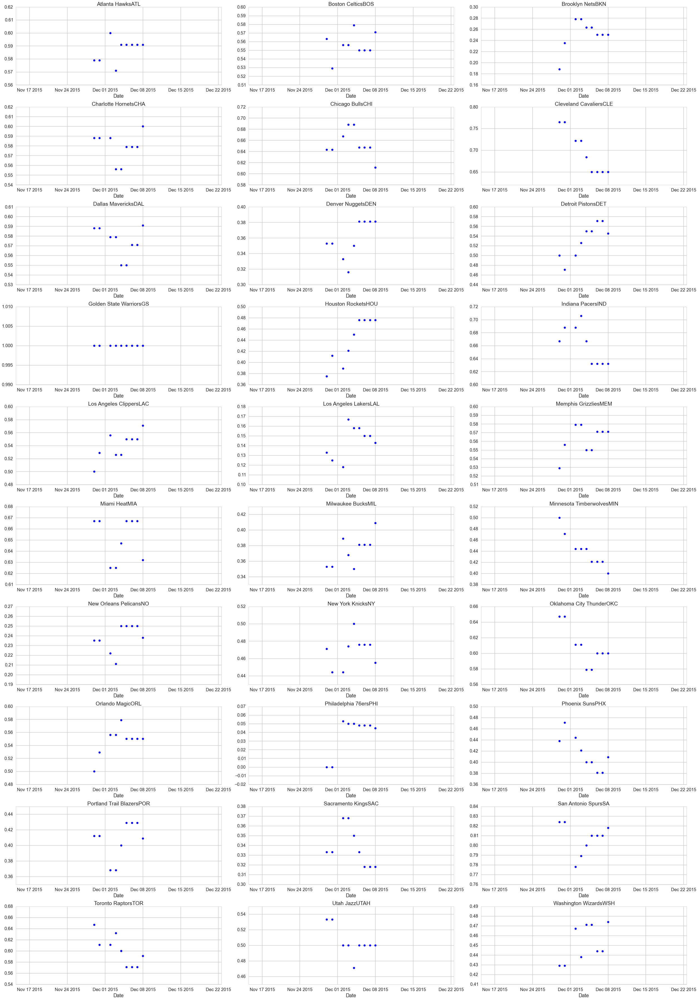

In [27]:
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(35, 50), tight_layout=True)

for ax, team in zip(axes.ravel(), result.groupby('Teams')):
    #establish a figure
    plt.figure()
    ax.scatter(team[1]['Date'].values, team[1]['PCT'].values, alpha=1, color='b', lw=3)
    ax.set_title(team[0])
    ax.set_xlabel('Date')

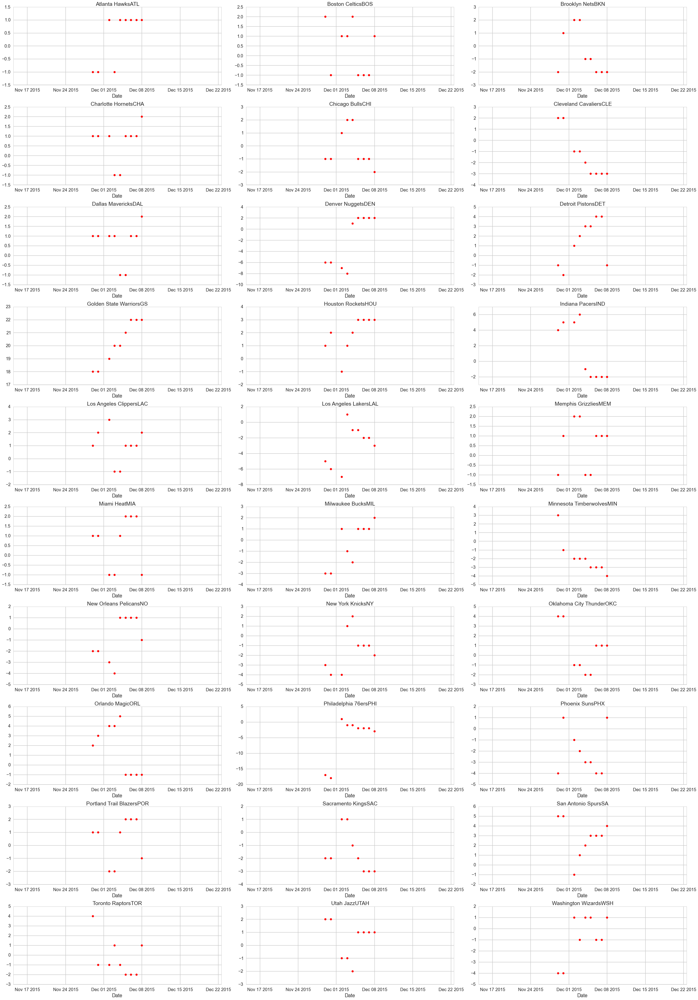

In [28]:
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(35, 50), tight_layout=True)

for ax, team in zip(axes.ravel(), result.groupby('Teams')):
    plt.figure()
    ax.scatter(team[1]['Date'].values, team[1]['STRK'].values, alpha=1, color='r', lw=3)
    ax.set_title(team[0])
    ax.set_xlabel('Date')

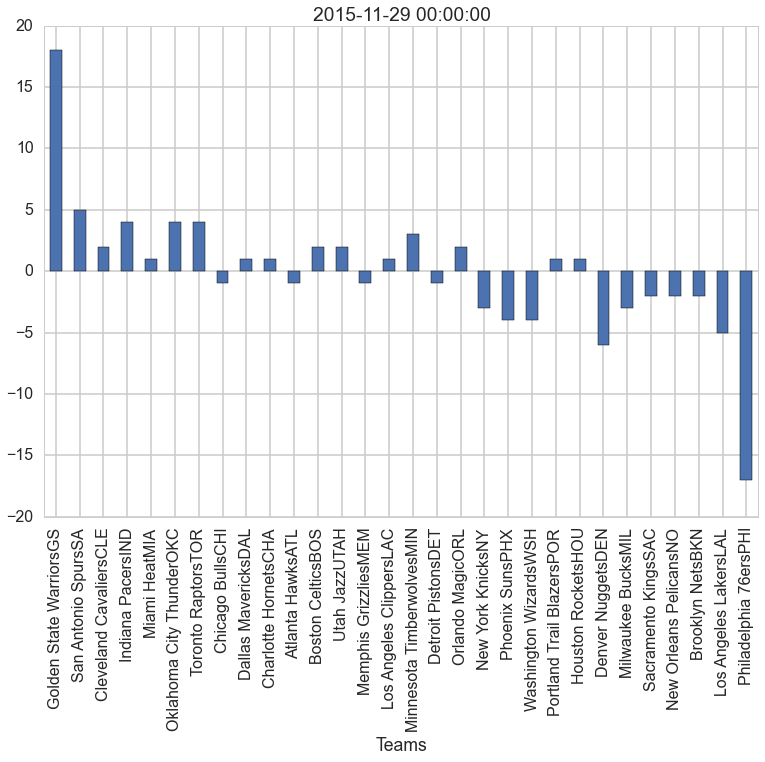

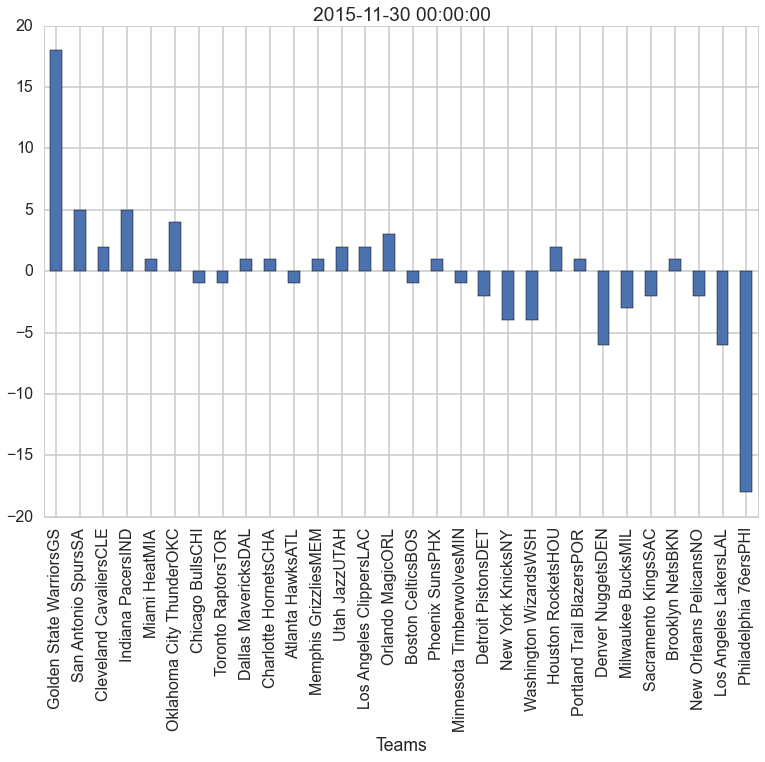

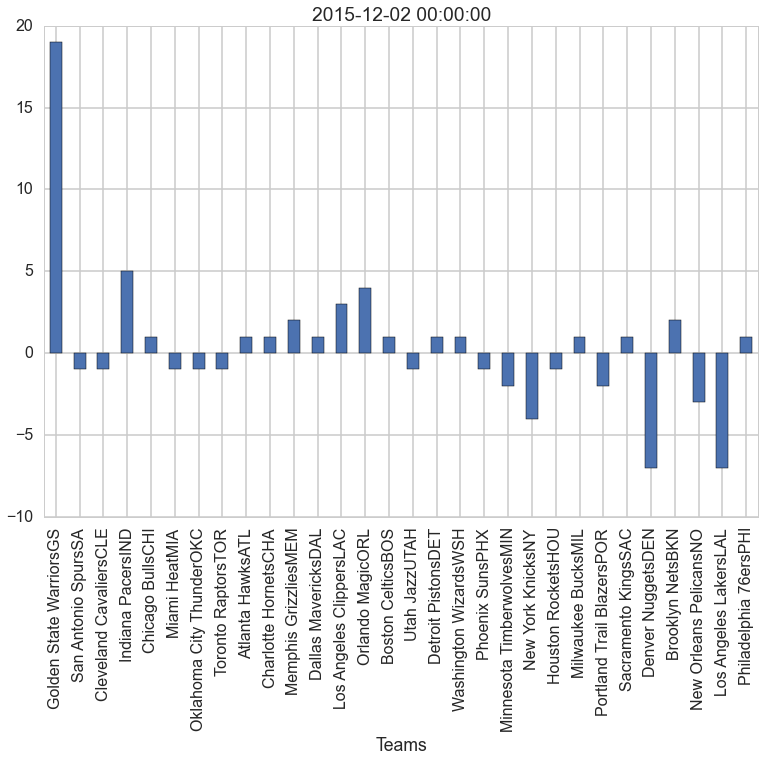

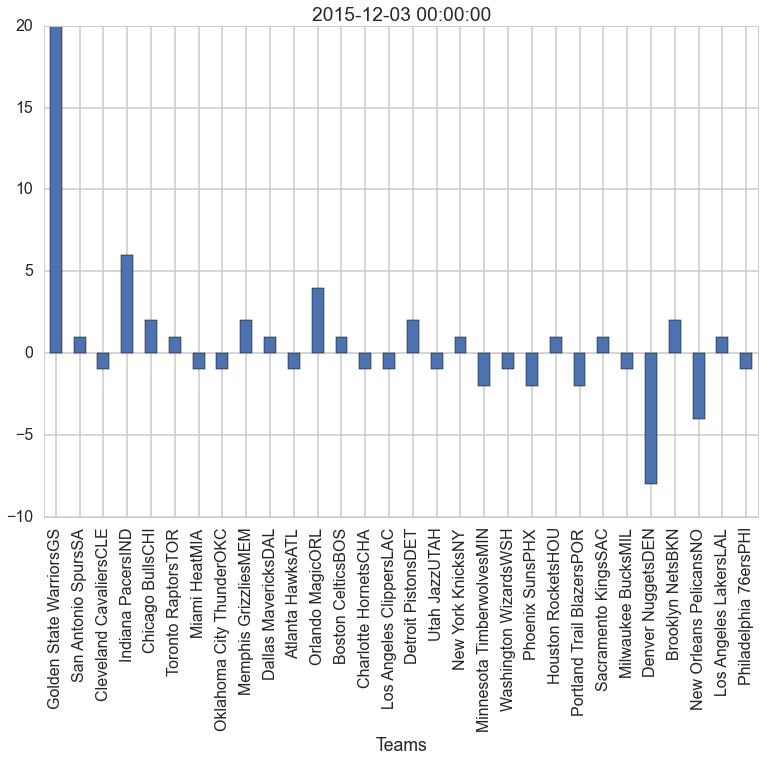

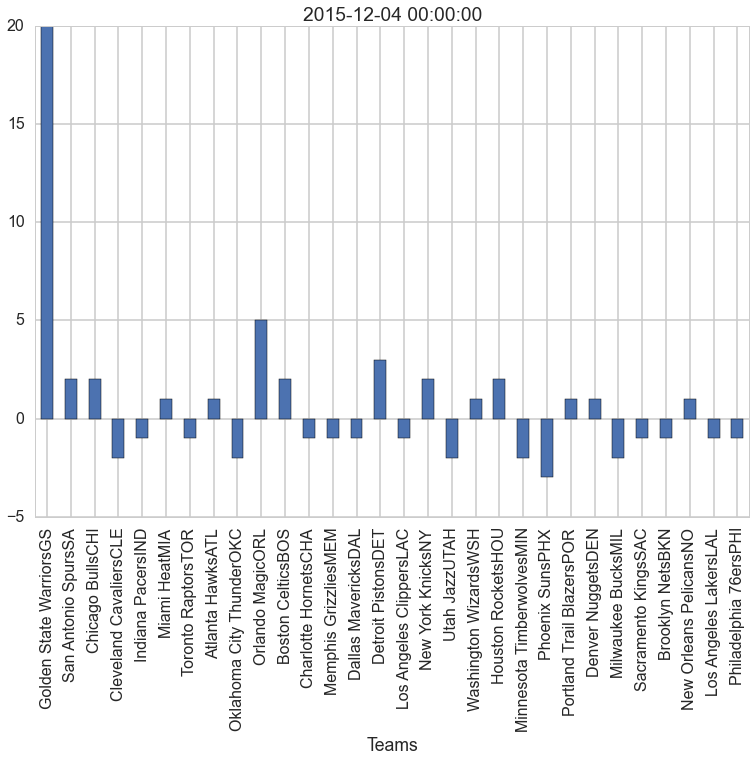

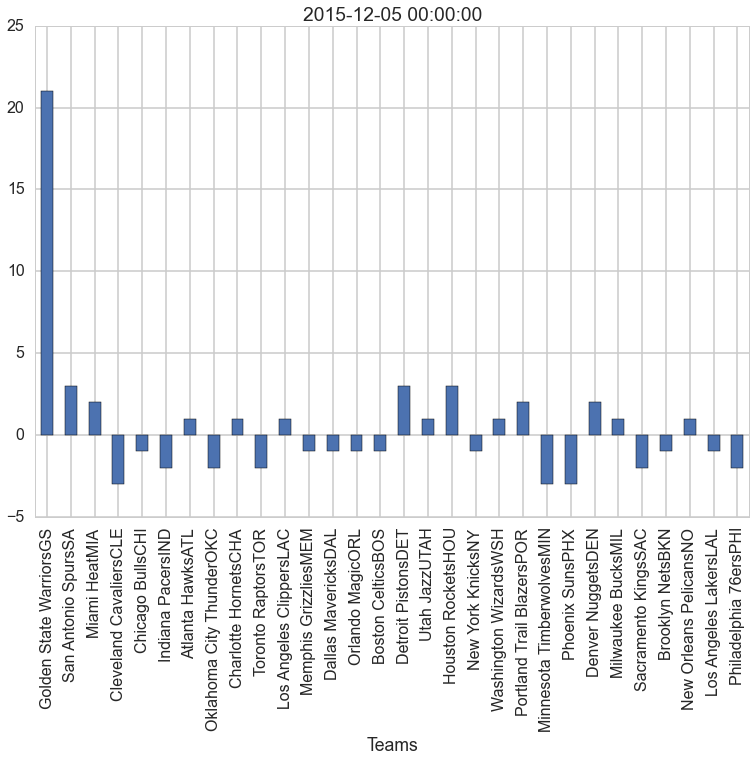

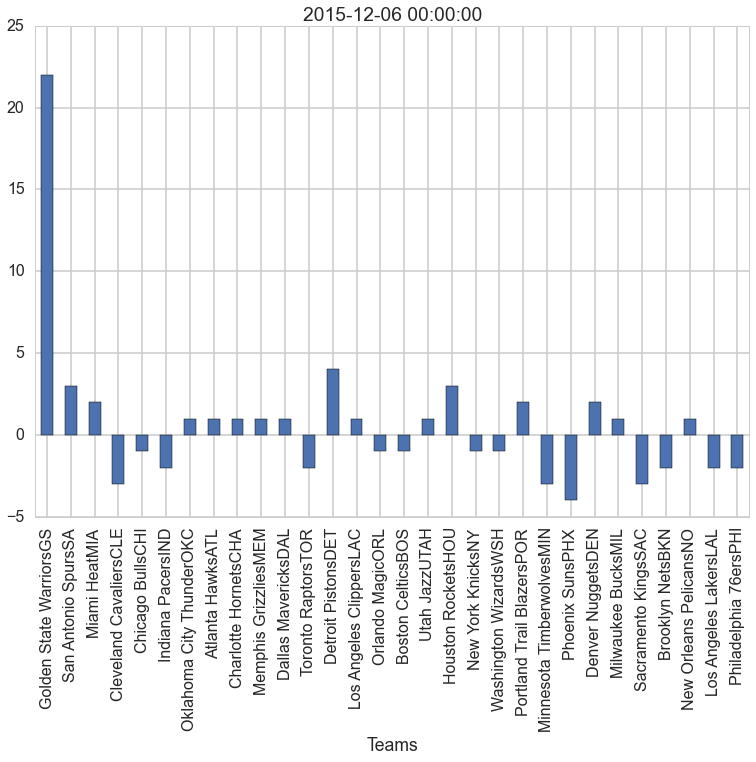

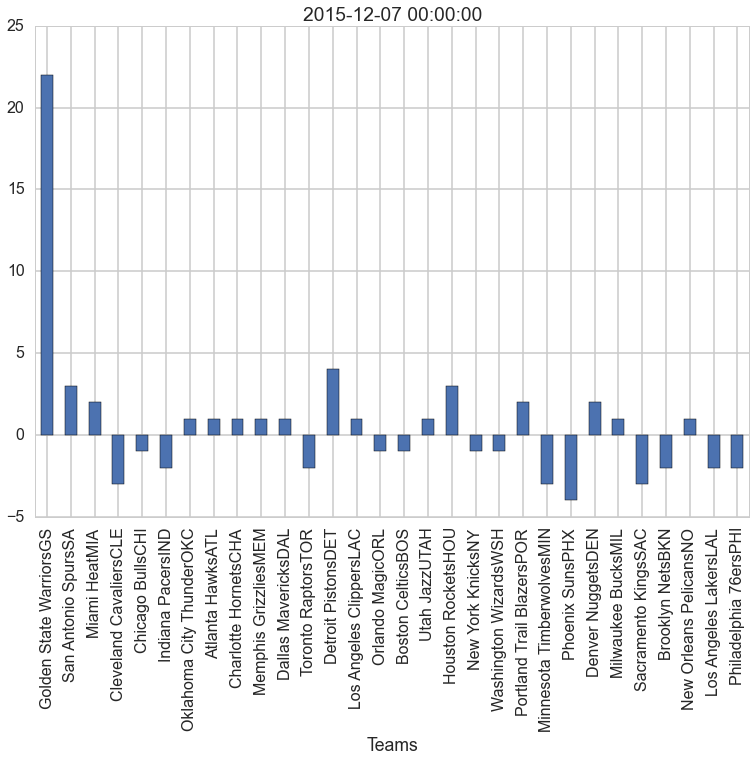

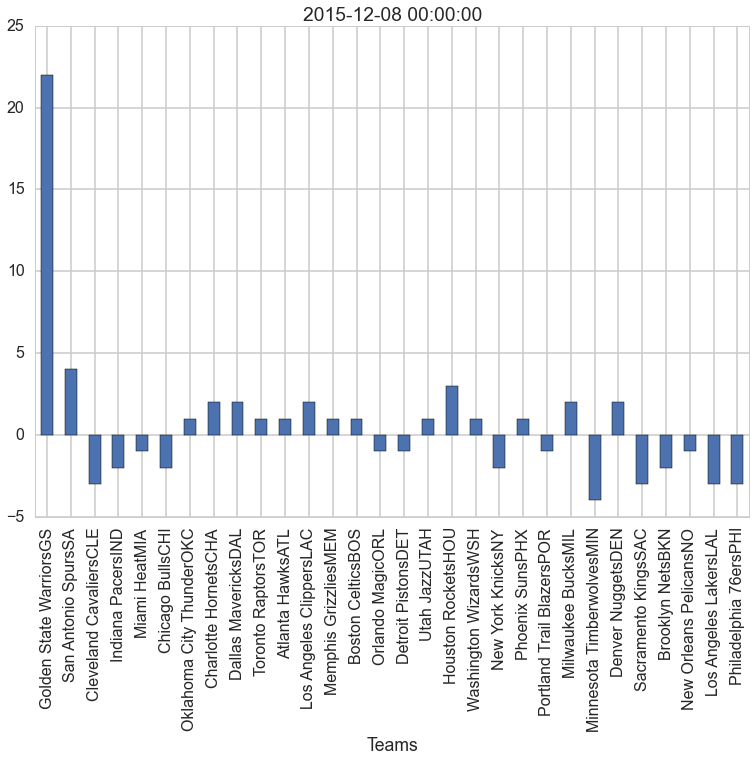

In [29]:
for day in result.groupby('Date'):
    plt.figure()
    lol=day[1].set_index('Teams')
    lol['STRK'].plot(kind='bar')
    plt.title(day[0])
    plt.xlabel('Teams')
    plt.show()

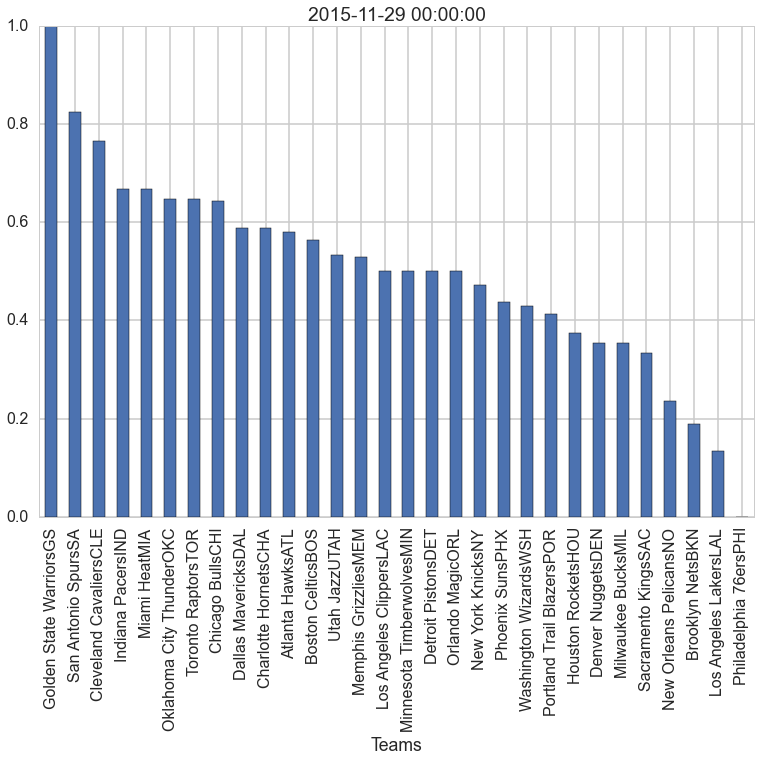

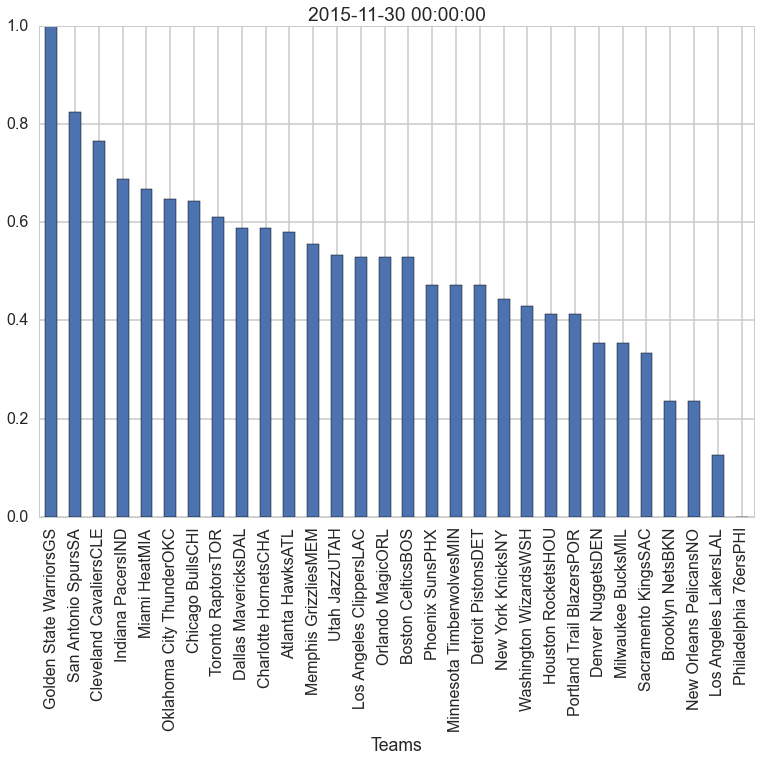

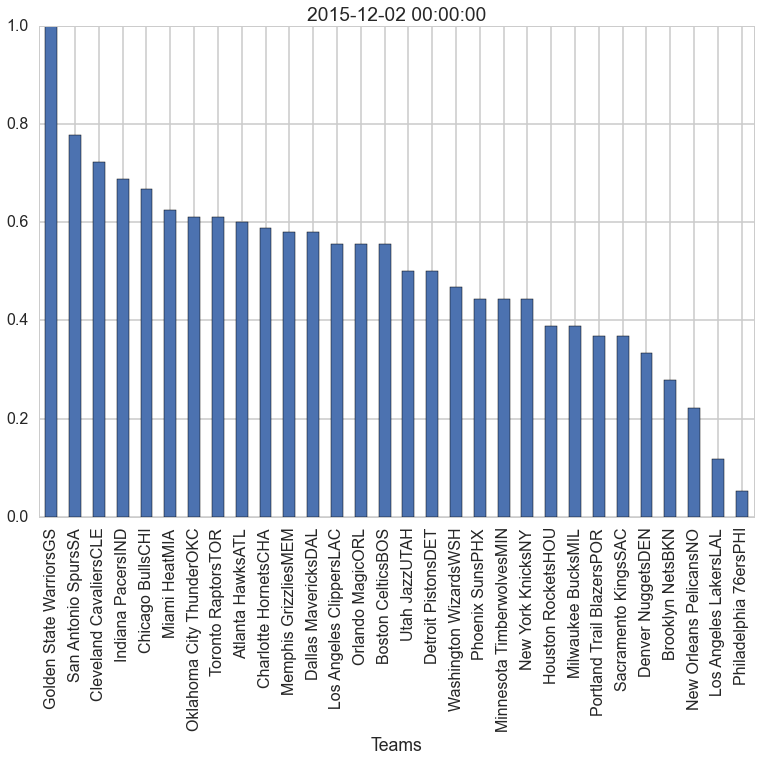

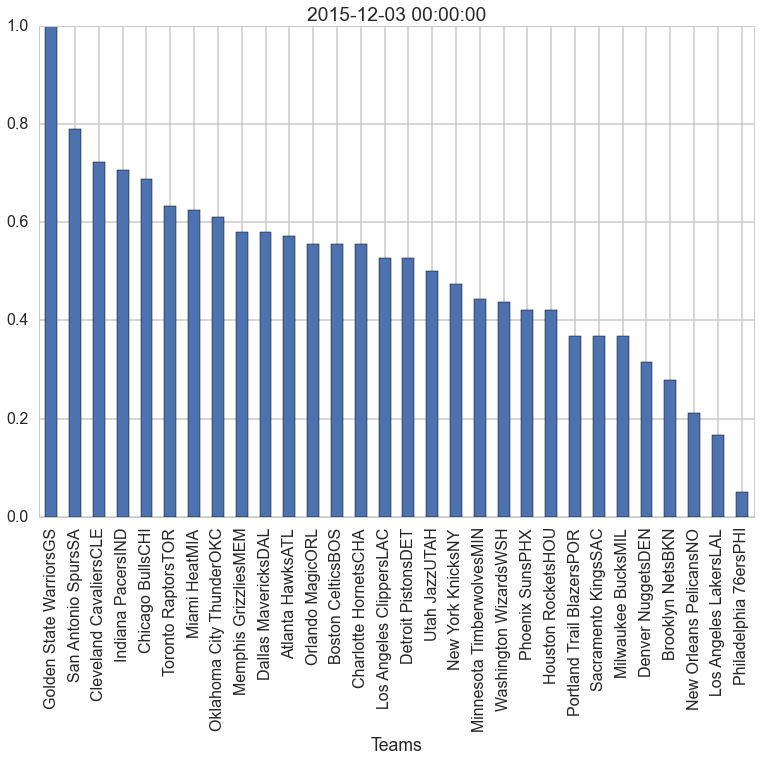

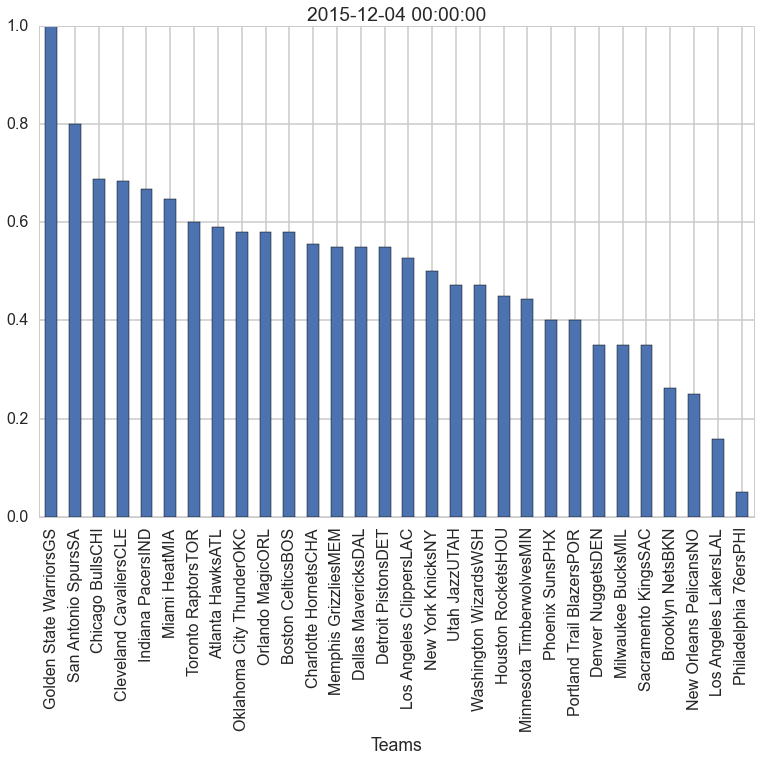

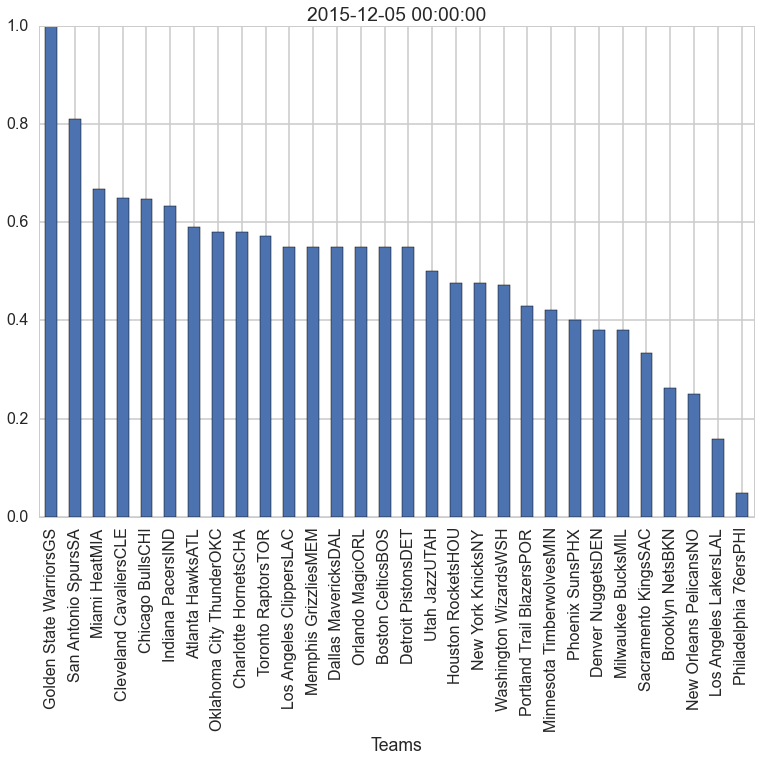

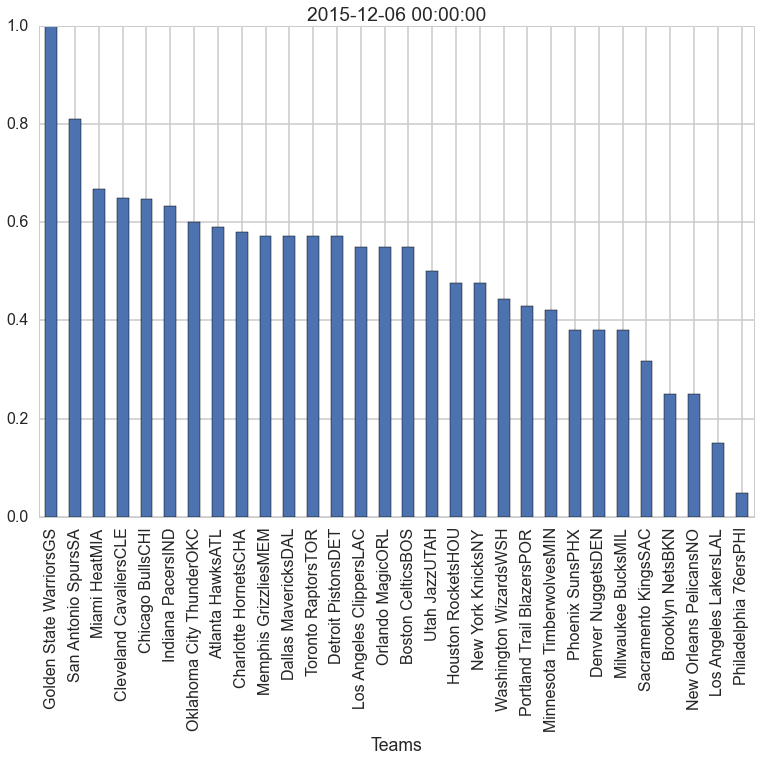

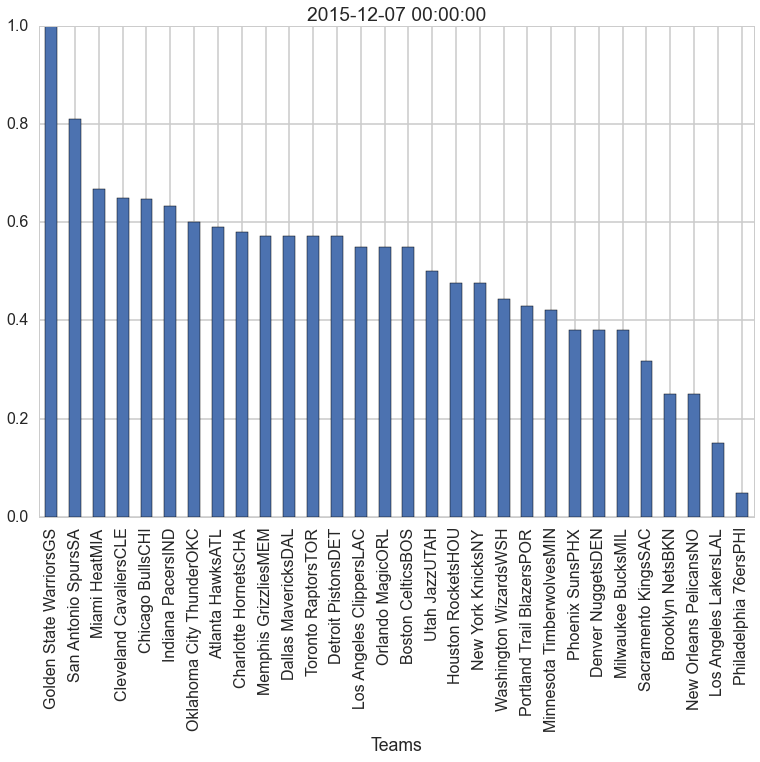

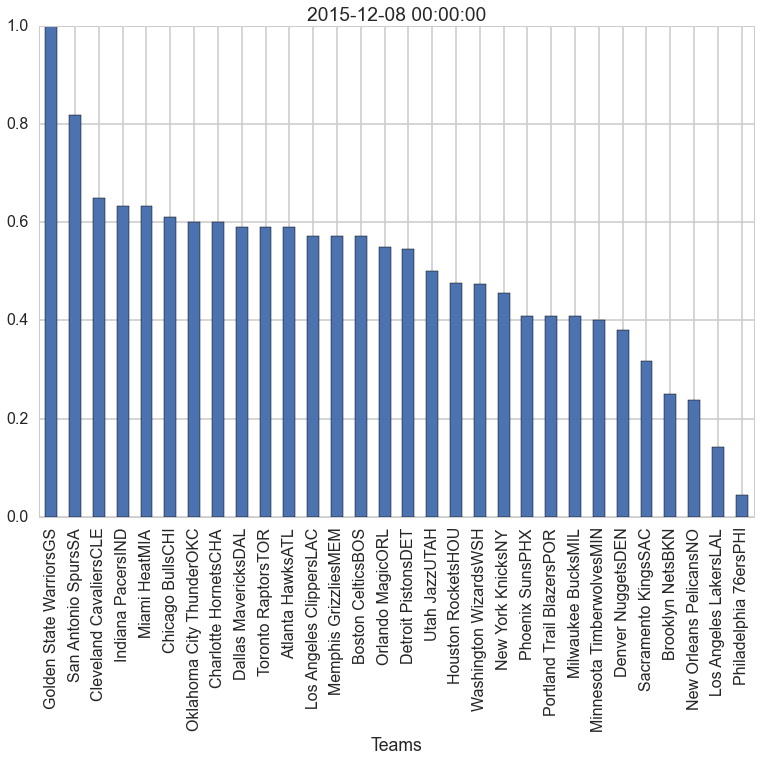

In [30]:
for day in result.groupby('Date'):
    plt.figure()
    lol=day[1].set_index('Teams')
    lol['PCT'].plot(kind='bar')
    plt.title(day[0])
    plt.xlabel('Teams')
    plt.show()

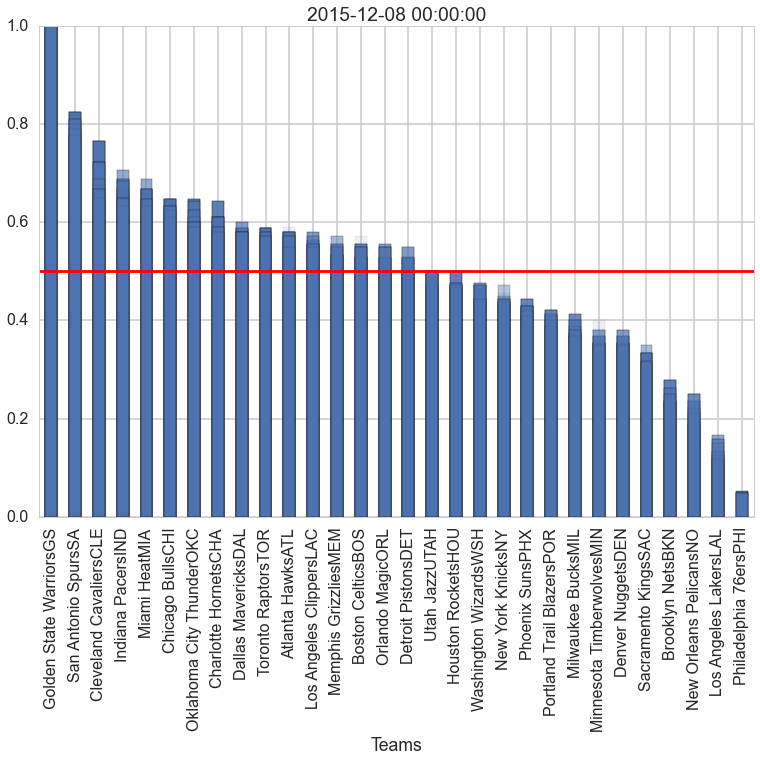

In [32]:
#scatter plot of ticket price vs. winning record here
plt.figure()
count=0.9

for day in result.groupby('Date'):
    lol=day[1].set_index('Teams')
    lol['PCT'].plot(kind='bar', alpha=count)
    plt.title(day[0])
    plt.xlabel('Teams')
    count-=0.1
plt.axhline(y=0.5, color='r')
plt.show()

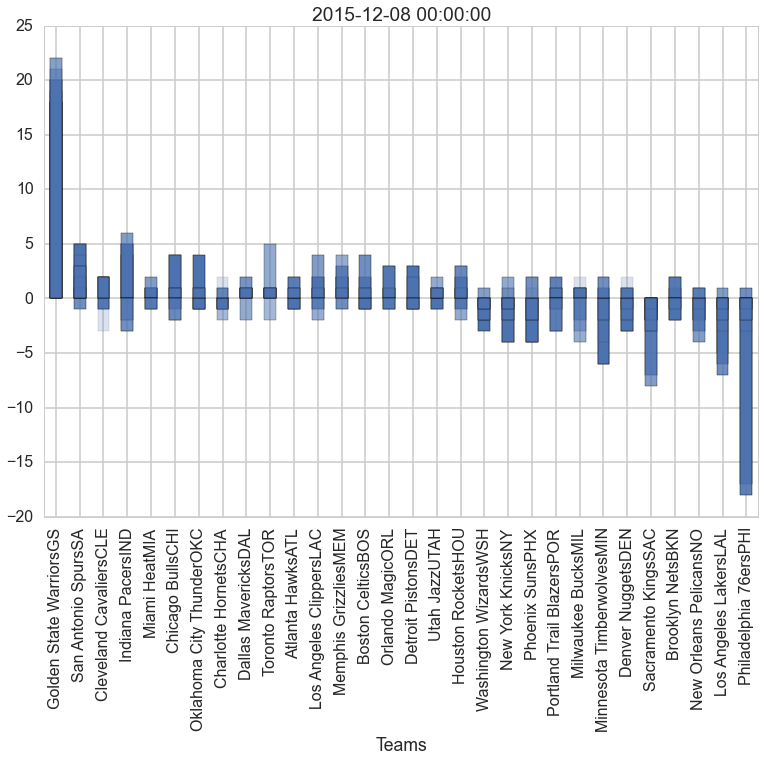

In [34]:
plt.figure()
count=1
for day in result.groupby('Date'):
    lol=day[1].set_index('Teams')
    lol['STRK'].plot(kind='bar', alpha=count)
    plt.title(day[0])
    plt.xlabel('Teams')
    count-=0.10
plt.show()

##IV.ii Salary

In [35]:
NBAsalaryplayers=pd.read_csv("/Users/baekstboy/Desktop/CS109Project/Salary/NBA" + "2015-11-29" + ".csv", index_col=0)
NBAsalary1=NBAsalaryplayers.groupby('TEAM').sum()
NBAsalary1.drop('RK', axis=1, inplace=True)
NBAsalary2=NBAsalaryplayers.groupby('TEAM').count()
NBAsalary2.drop(NBAsalary2.columns[[0,2]], axis=1, inplace=True)
NBAsalary=pd.concat([NBAsalary1, NBAsalary2], axis=1)
NBAsalary.columns = ['TotalSalary', 'Count']
NBAsalary.sort(columns='TotalSalary', ascending=False)

,TotalSalary,Count
TEAM,,
Brooklyn Nets,58654317,3
Oklahoma City Thunder,47064686,3
Dallas Mavericks,42455978,3
Golden State Warriors,40274517,3
Los Angeles Clippers,37743176,2
Cleveland Cavaliers,36363463,2
Houston Rockets,36165115,2
Miami Heat,35644400,2
Sacramento Kings,34063326,2


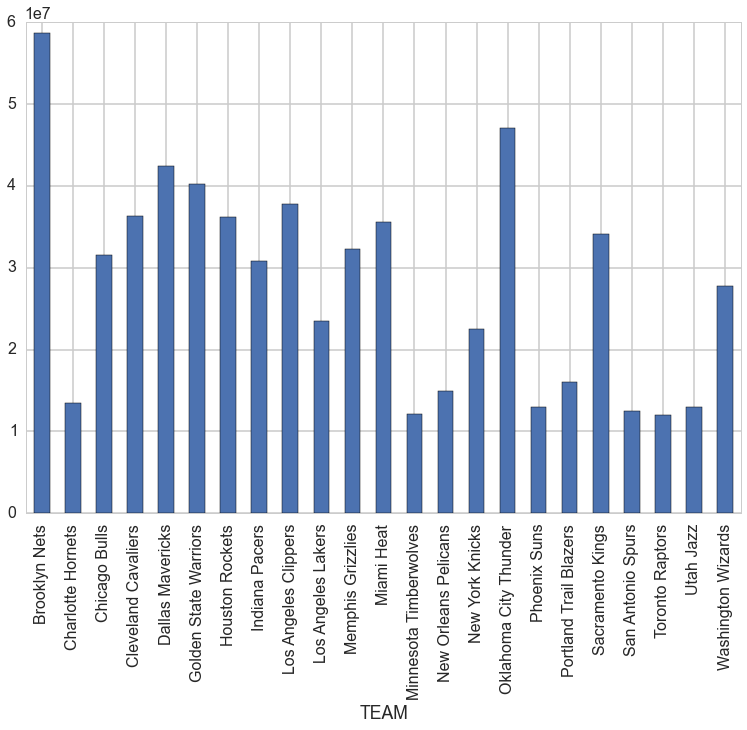

In [36]:
NBAsalary['TotalSalary'].plot(kind='bar')

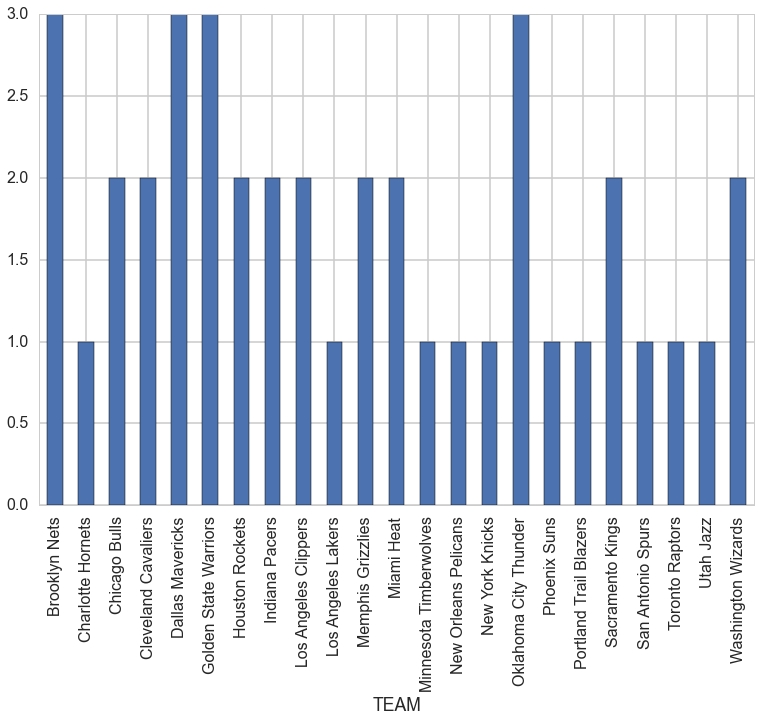

In [37]:
NBAsalary['Count'].plot(kind='bar')

## IV.iii Attendance

In [40]:
attendance=pd.read_csv("/Users/baekstboy/Desktop/CS109Project/Attendance/NBA" + "2015-12-08" + ".csv", index_col=0)

In [41]:
attendance.columns = ['RK','TEAM','HomeGames', 'HomeTotal','HomeAVG','HomePCT','AwayGames','AwayAVG','AwayPCT','TotalGames', 'TotalAVG','TotalPCT']
attendance.sort('TotalPCT', ascending=False).head(2)

,RK,TEAM,HomeGames,HomeTotal,HomeAVG,HomePCT,AwayGames,AwayAVG,AwayPCT,TotalGames,TotalAVG,TotalPCT
10,11,Lakers,7,132979,18997,99.7,14,19417,99.6,21,19277,99.6
12,13,Thunder,12,218436,18203,100.0,8,19104,99.0,20,18563,99.6


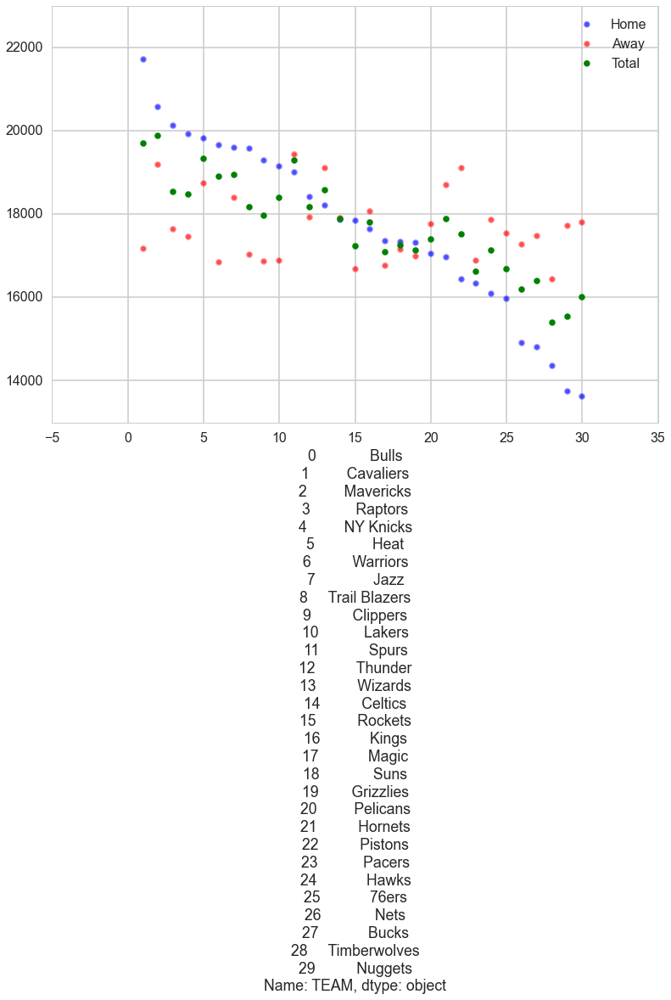

In [42]:
plt.figure()
plt.scatter(attendance.set_index('TEAM')['RK'], attendance.set_index('TEAM')['HomeAVG'], alpha=0.5, color='b', lw=3, label='Home')
plt.scatter(attendance.set_index('TEAM')['RK'], attendance.set_index('TEAM')['AwayAVG'], alpha=0.5, color='r', lw=3, label='Away')
plt.scatter(attendance.set_index('TEAM')['RK'], attendance.set_index('TEAM')['TotalAVG'], alpha=1, color='g', lw=3, label='Total')
plt.legend(loc='best')
plt.xlabel(attendance['TEAM'])
plt.show()

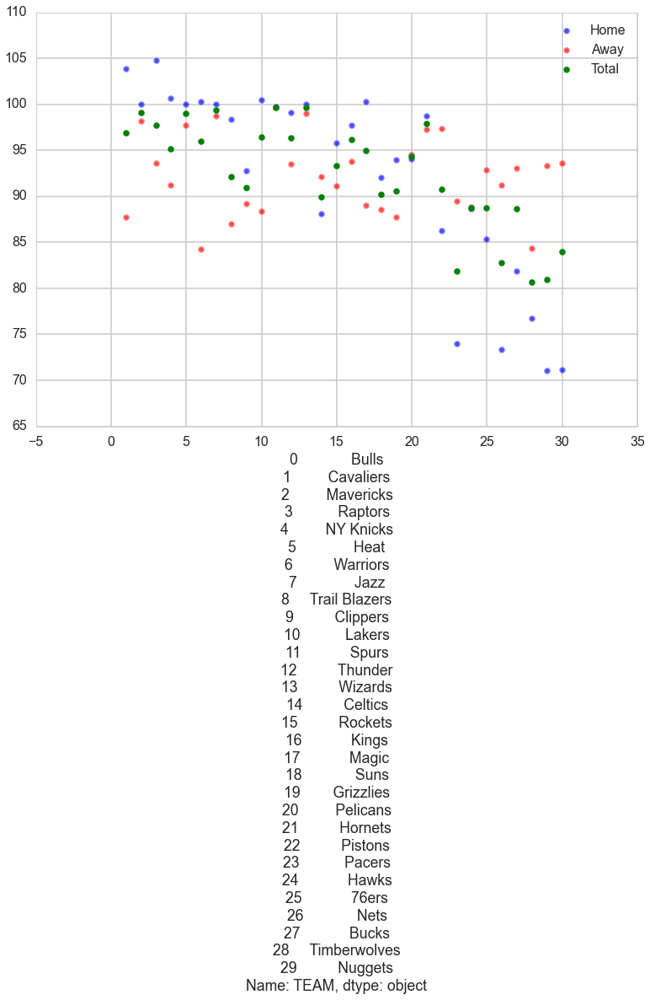

In [43]:
plt.figure()
plt.scatter(attendance.set_index('TEAM')['RK'], attendance.set_index('TEAM')['HomePCT'], alpha=0.5, color='b', lw=3, label='Home')
plt.scatter(attendance.set_index('TEAM')['RK'], attendance.set_index('TEAM')['AwayPCT'], alpha=0.5, color='r', lw=3, label='Away')
plt.scatter(attendance.set_index('TEAM')['RK'], attendance.set_index('TEAM')['TotalPCT'], alpha=1, color='g', lw=3, label='Total')
plt.legend(loc='best')
plt.xlabel(attendance['TEAM'])
plt.show()

##IV.iv Ticket Prices

In [44]:
a=pd.read_csv("/Users/baekstboy/Desktop/CS109Project/Tickets_Data/basketballdf" + "2015-11-25" + ".csv", index_col=0)
b=pd.read_csv("/Users/baekstboy/Desktop/CS109Project/Tickets_Data/basketballdf" + "2015-11-26" + ".csv", index_col=0)
c=pd.read_csv("/Users/baekstboy/Desktop/CS109Project/Tickets_Data/basketballdf" + "2015-11-27" + ".csv", index_col=0)
d=pd.read_csv("/Users/baekstboy/Desktop/CS109Project/Tickets_Data/basketballdf" + "2015-11-28" + ".csv", index_col=0)
e=pd.read_csv("/Users/baekstboy/Desktop/CS109Project/Tickets_Data/basketballdf" + "2015-11-29" + ".csv", index_col=0)
f=pd.read_csv("/Users/baekstboy/Desktop/CS109Project/Tickets_Data/basketballdf" + "2015-11-30" + ".csv", index_col=0)
g=pd.read_csv("/Users/baekstboy/Desktop/CS109Project/Tickets_Data/basketballdf" + "2015-12-01" + ".csv", index_col=0)
h=pd.read_csv("/Users/baekstboy/Desktop/CS109Project/Tickets_Data/basketballdf" + "2015-12-03" + ".csv", index_col=0)
i=pd.read_csv("/Users/baekstboy/Desktop/CS109Project/Tickets_Data/basketballdf" + "2015-12-04" + ".csv", index_col=0)
j=pd.read_csv("/Users/baekstboy/Desktop/CS109Project/Tickets_Data/basketballdf" + "2015-12-05" + ".csv", index_col=0)
frames = [a,b,c,d,e,f,g,h,i,j]
tickets = pd.concat(frames).reset_index(drop=True)
tickets.drop(tickets.columns[[0,6,7,10,11,17,18,19,21,22,29]], axis=1, inplace=True)
tickets['dateutc'] = tickets['dateutc'].astype('datetime64')
#delete
# index 0
# datetime local 6
# created_at 7
# country 10
# extended address 11
# announce date 17
# short title 18
# datetime utc 19
# datetime tbd 21
# visible until utc 22
# time utc 29

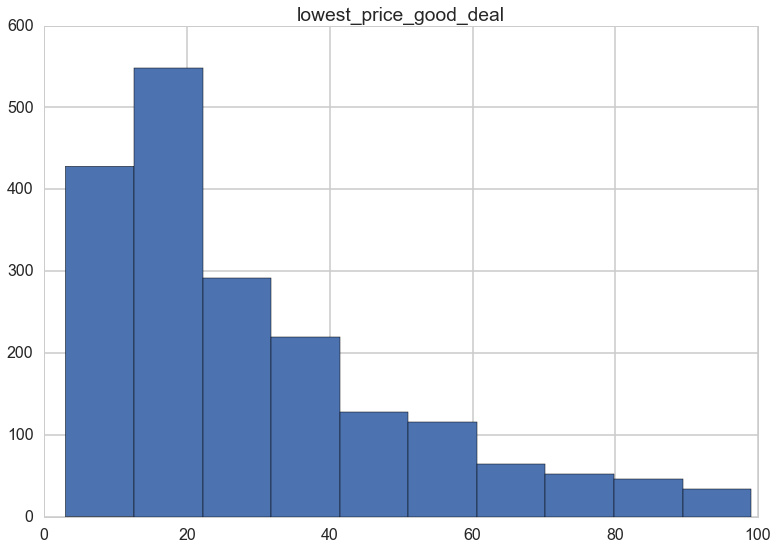

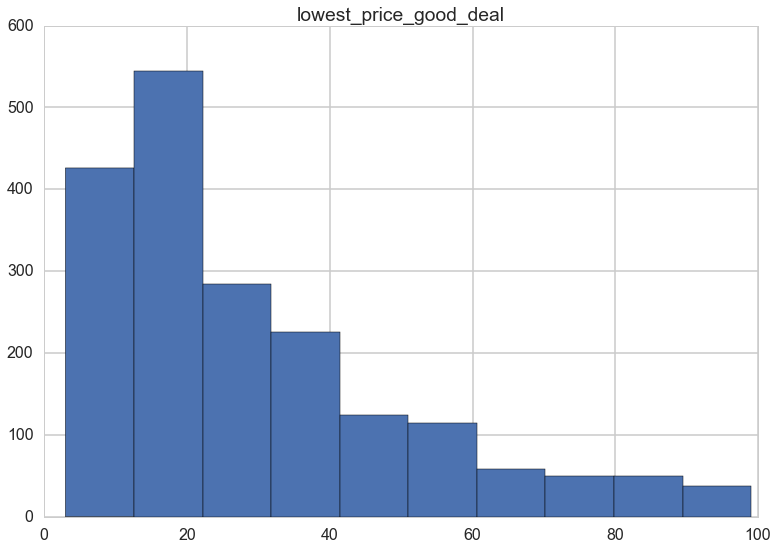

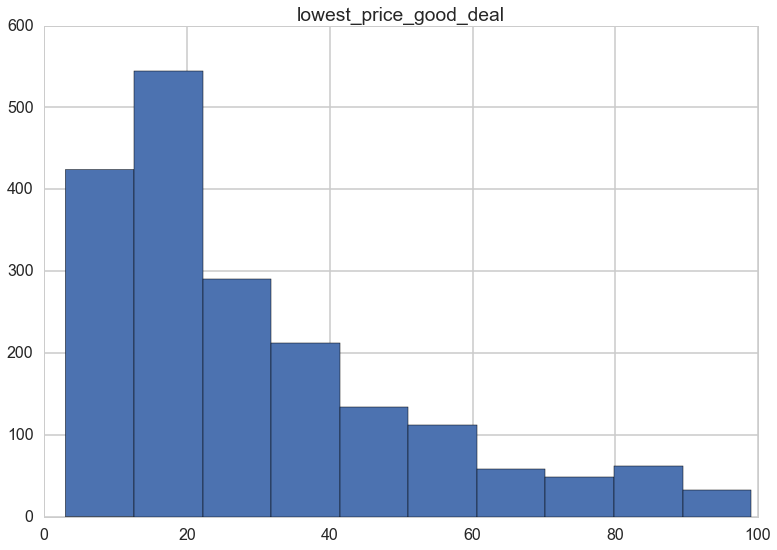

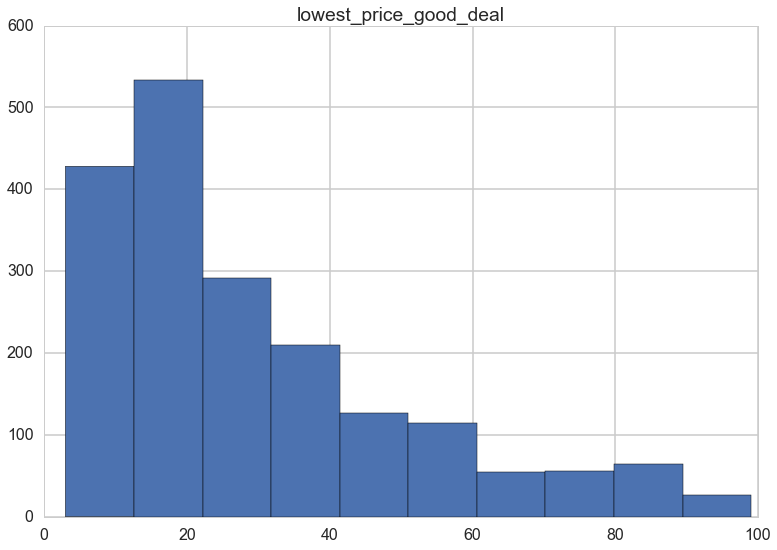

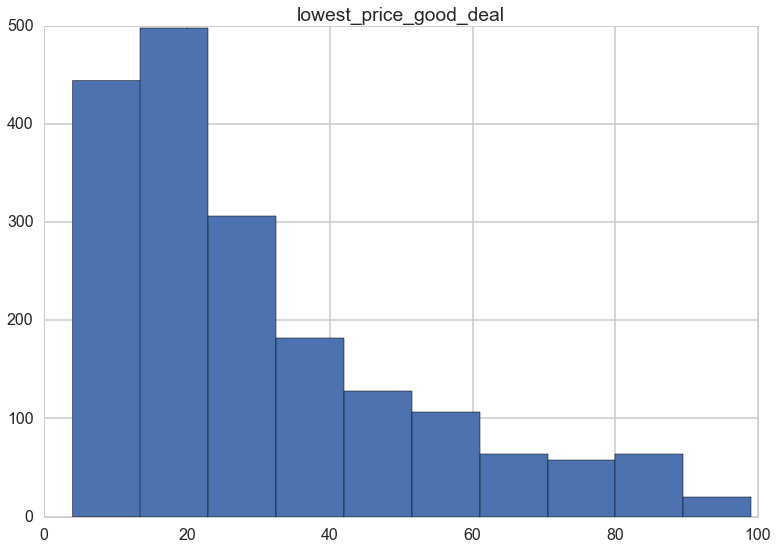

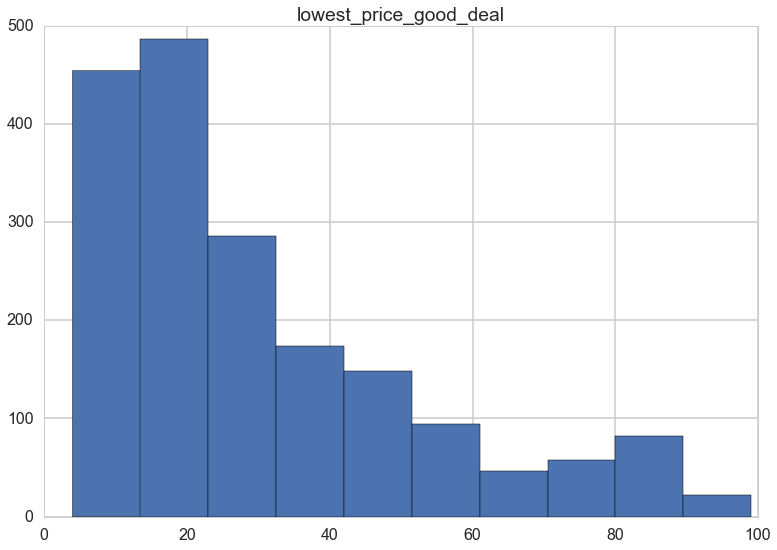

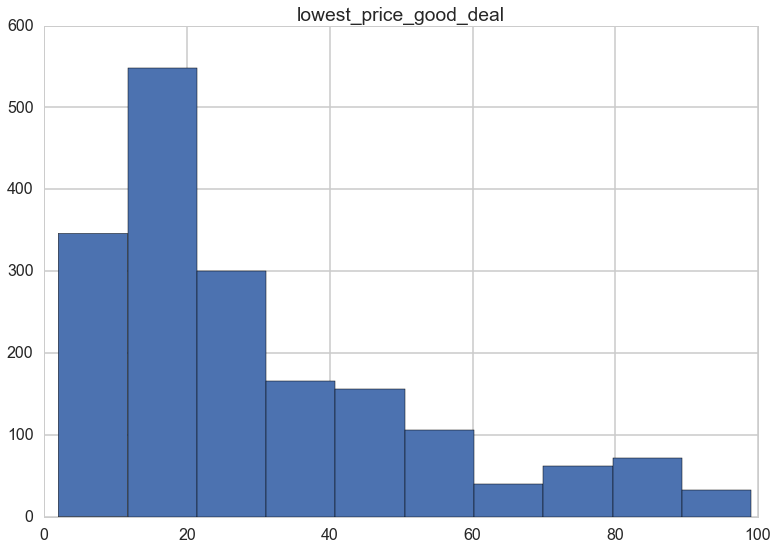

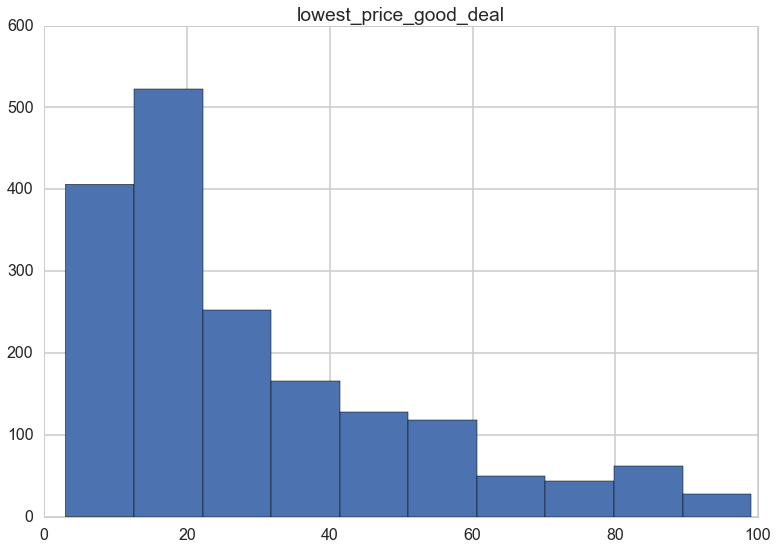

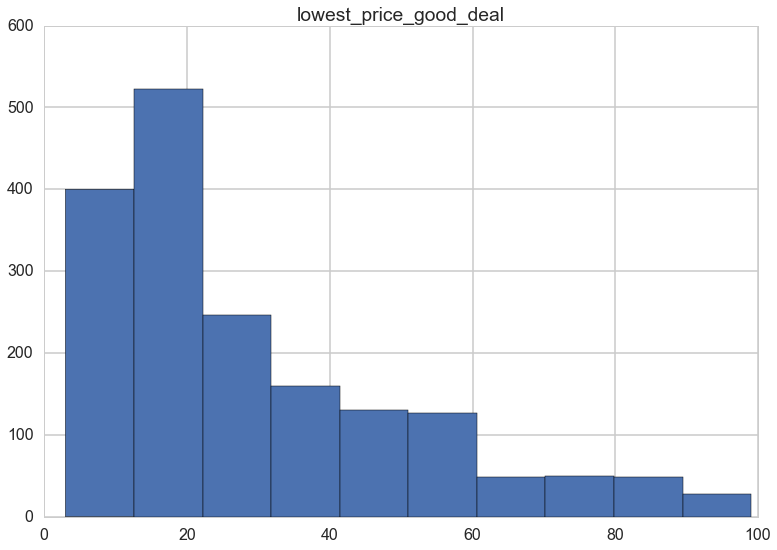

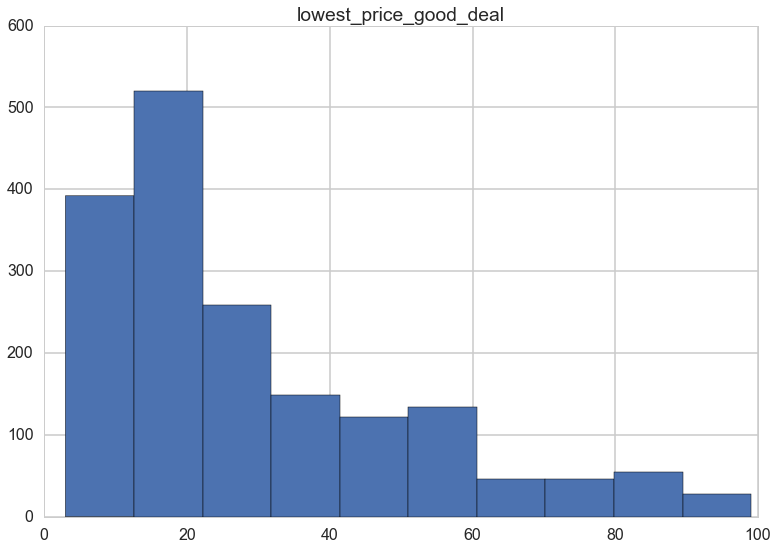

In [57]:
for x in frames:
    x[x['lowest_price_good_deal']<100].hist(column='lowest_price_good_deal')

In [136]:
friday=[]
lol=datetime.datetime.strptime('2015-12-04', '%Y-%m-%d')
while lol<datetime.datetime.strptime('2016-04-15', '%Y-%m-%d'):
    lol=lol + datetime.timedelta(days=7)
    friday.append(lol)

sunday=[]
lol=datetime.datetime.strptime('2015-12-06', '%Y-%m-%d')
while lol<datetime.datetime.strptime('2016-04-17', '%Y-%m-%d'):
    lol=lol + datetime.timedelta(days=7)
    sunday.append(lol)
    
weekend=[]
for x in range(len(friday)):
    weekend.append((str(friday[x]),str(sunday[x])))

In [198]:
fulldf.head(2)

,listing_count,avg_price,lowest_price_good,lowest_price,highest_price,city,venuename,venuescore,ticket_score,id,home_team,away_team,hometeamscore,awayteamscore,dateutc,daysaway,dateloaded,City,cntStars_home,WPCT_home,STRK_home,rankNBA_home,cntStars_away,WPCT_away,STRK_away,rankNBA_away,HomeAVG,HomePCT,AwayAVG,AwayPCT,TotalAVG,TotalPCT,Population,numTeams,holiday,weekday
1,815,62,20,20,1800,Miami,American Airlines Arena,0.85776,0.78884,2759732,Miami Heat,Boston Celtics,0.78556,0.74908,2015-12-01,2,2015-11-29,Miami,2,0.667,1,5,0,0.563,2,12,19659,100.3,16840,84.2,18720,94.9,5764000,4,0,Tuesday
4,3431,146,49,49,6505,Miami,American Airlines Arena,0.85776,0.84152,2759651,Miami Heat,Brooklyn Nets,0.78556,0.75524,2015-12-29,30,2015-11-29,Miami,2,0.667,1,5,3,0.188,-2,28,19659,100.3,16840,84.2,18720,94.9,5764000,4,0,Tuesday


For every days that we collected, we wanted to show a distribution of the ticket prices. We removed very few extreme outliers that were expensive and didn't contribute to the general distribution. The distribution doesn't change much at any given moment. 

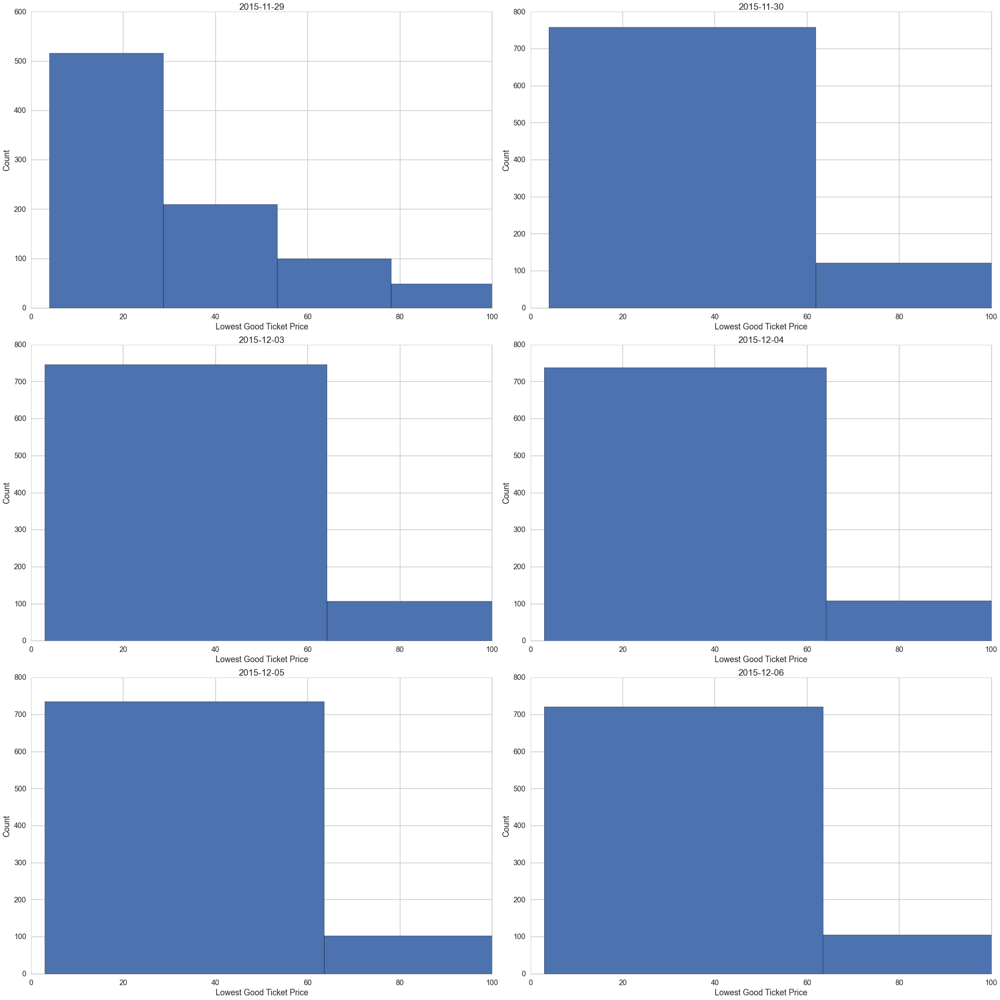

In [210]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(35, 50), tight_layout=True)

for ax, day in zip(axes.ravel(), fulldf.groupby('dateloaded')):
    #establish a figure
    plt.figure()
    day[1]['lowest_price_good'].plot(kind='hist', figsize=(30,30), ax=ax)
    ax.set_title(day[0])
    ax.set_xlim(0,100)
    ax.set_xlabel('Lowest Good Ticket Price')
    ax.set_ylabel('Count')

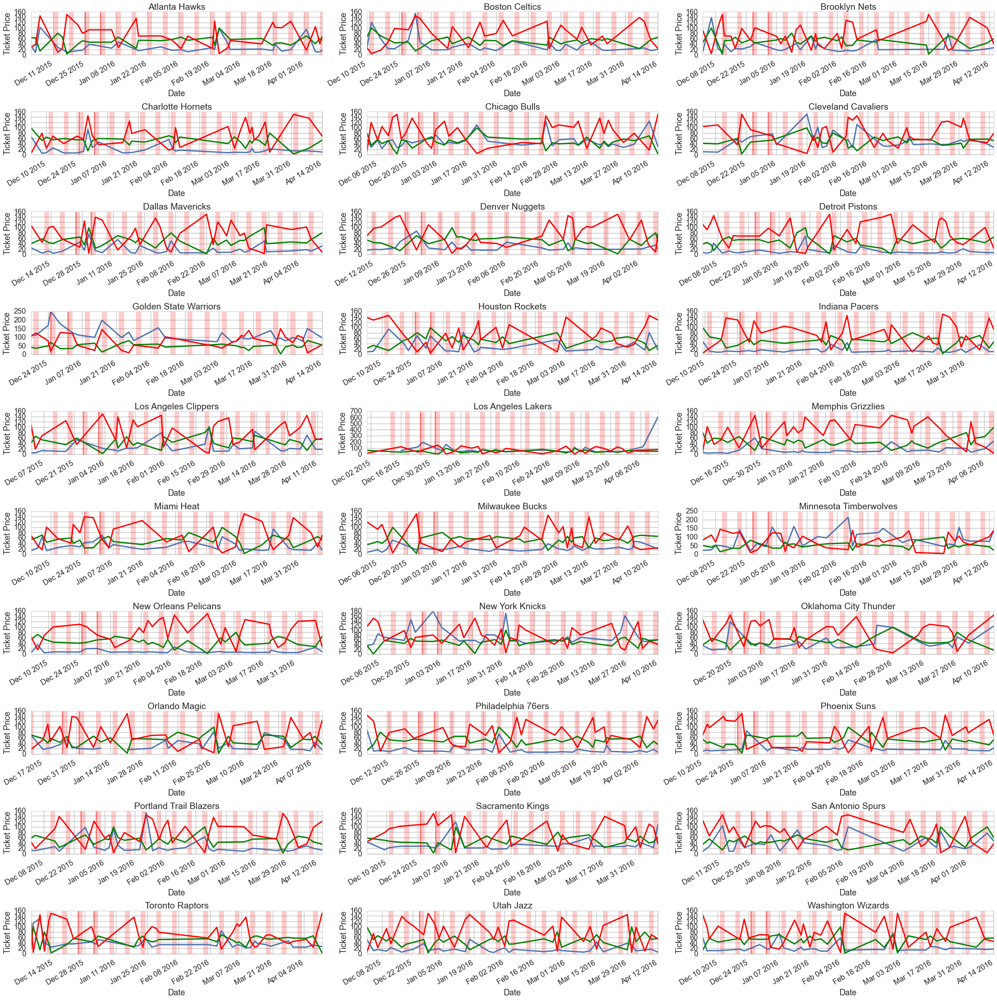

In [251]:
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(35, 50), tight_layout=True)

for ax, team in zip(axes.ravel(), fulldf.groupby('home_team')):
    #establish a figure
    plt.figure()
    team[1].groupby('dateutc').mean()['lowest_price_good'].plot(figsize=(30,30), ax=ax)
    (team[1].groupby('dateutc').mean()['WPCT_away']*100).plot(figsize=(30,30), ax=ax, color='g')
    (team[1].groupby('dateutc').mean()['rankNBA_away']*5).plot(figsize=(30,30), ax=ax, color='r')

    ax.axvline(x='2015-12-25', color='red', alpha=0.4, linewidth=3)    
    ax.axvline(x='2016-01-01', color='red', alpha=0.4, linewidth=3)
    ax.axvspan('2015-11-26', '2015-11-29', color='red', alpha=0.2)
    for x in range(len(weekend)):
        ax.axvspan(weekend[x][0], weekend[x][1], color='red', alpha=0.2)
    ax.set_title(team[0])
    ax.set_xlabel('Date')
    ax.set_ylabel('Ticket Price')

Since the above graph is hard to read on individual basis, we show the following plot.
In some cases, you see a spike or rise in ticket price for holiday season. But you also see weak teams like Sacramento Kings, Milwaukee Bucks, and Washington Wizards who are not seeing the effect of holidays and weekend as much. Thus, we suspected while holidays and weekends do play a part, we have to look at team performance information to explain this discrepancy. 

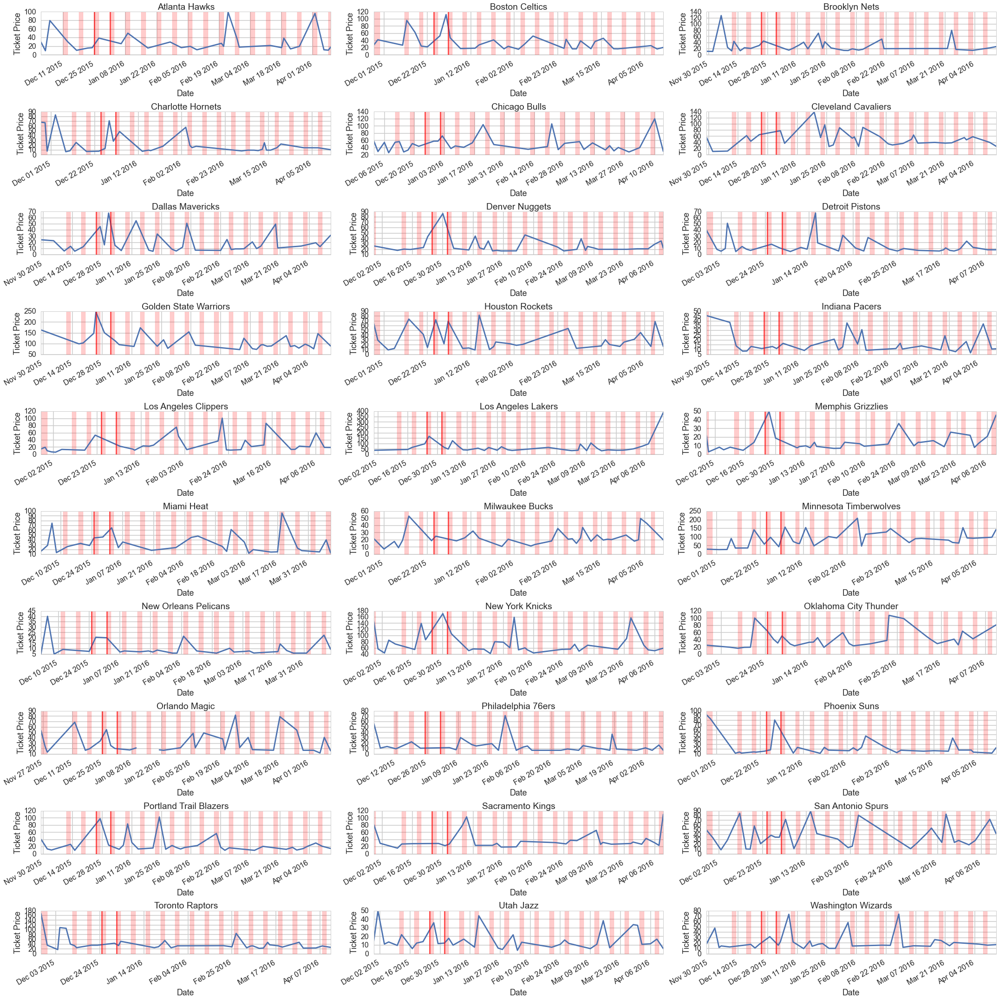

In [182]:
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(35, 50), tight_layout=True)

for ax, team in zip(axes.ravel(), tickets.groupby('home_team')):
    #establish a figure
    plt.figure()
    team[1].groupby('dateutc').mean()['lowest_price_good_deal'].plot(figsize=(30,30), ax=ax)
    ax.axvline(x='2015-12-25', color='red', alpha=0.6, linewidth=3, label='Christmas')    
    ax.axvline(x='2016-01-01', color='red', alpha=0.6, linewidth=3, label='New Years')
    ax.axvspan('2015-11-26', '2015-11-29', color='red', alpha=0.2)
    for x in range(len(weekend)):
        ax.axvspan(weekend[x][0], weekend[x][1], color='red', alpha=0.2)
    
    ax.set_title(team[0])
    ax.set_xlabel('Date')
    ax.set_ylabel('Ticket Price')

First, we studied how lowest good ticket price changes over time. We show a macro level showing each team's evolution so we can see how they ticket prices change in relative to others. We see some interesting trend. For example, Golden Warriors (who is #1 in NBA at the moment) has not only the highest ticket price in relative to other teams, but also the effect of holidays (i.e. Christmas) and weekend is accented. Holidays (Christmas and New Years) are shown by red vertical lines, and red shaded regions show a Friday-Sunday weekend. Also, Lakers show a rise in ticket price towards the end of the season; it might be that people want to see Kobe Bryant, a NBA legend, play before he retires this season. In some cases, you see a spike or rise in ticket price for holiday season. But you also see weak teams like Sacramento Kings, Milwaukee Bucks, and Washington Wizards who are not seeing the effect of holidays and weekend as much. Thus, we suspected while holidays and weekends do play a part, we have to look at team performance information to explain this discrepancy. 


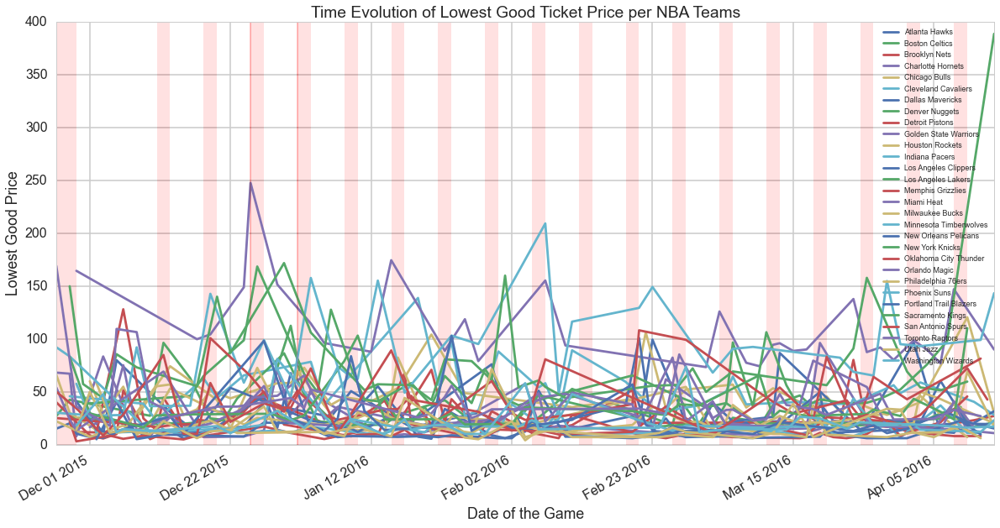

In [184]:
plt.figure()

for k, df in tickets.groupby('home_team'):
    df.groupby('dateutc').mean()['lowest_price_good_deal'].plot(label=k, figsize=(20,10))
    plt.legend(loc='best', prop={'size':9})    
    plt.axvline(x='2015-12-25', color='red', alpha=0.06, linewidth=0.3)    
    plt.axvline(x='2016-01-01', color='red', alpha=0.06, linewidth=0.3)
    plt.axvspan('2015-11-26', '2015-11-29', color='red', alpha=0.002)

    for x in range(len(weekend)):
        plt.axvspan(weekend[x][0], weekend[x][1], color='red', alpha=0.002)

plt.xlabel("Date of the Game")
plt.ylabel("Lowest Good Price")
plt.title("Time Evolution of Lowest Good Ticket Price per NBA Teams")
plt.show()

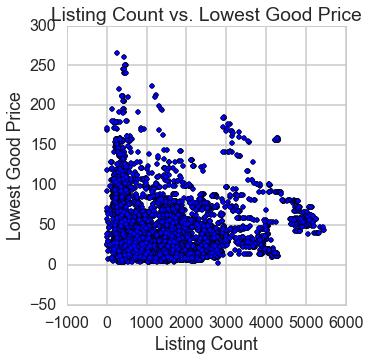

In [191]:
#effect of listing on ticket price
plt.figure(figsize=(5,5))
plt.scatter(tickets[tickets['lowest_price_good_deal']<500]['listing_count'] ,tickets[tickets['lowest_price_good_deal']<500]['lowest_price_good_deal'])
plt.xlabel("Listing Count")
plt.ylabel("Lowest Good Price")
plt.title("Listing Count vs. Lowest Good Price")
plt.show()

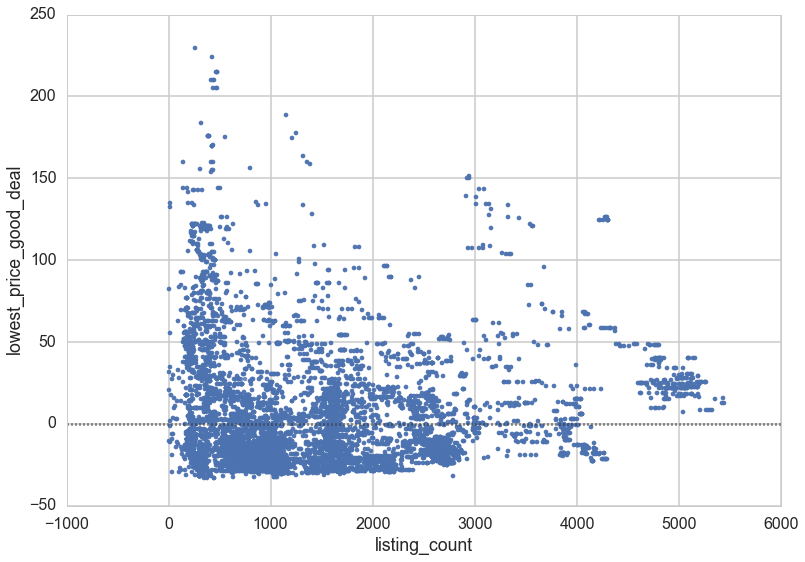

In [193]:
sns.residplot("listing_count", "lowest_price_good_deal", data=tickets[tickets['lowest_price_good_deal']<500])

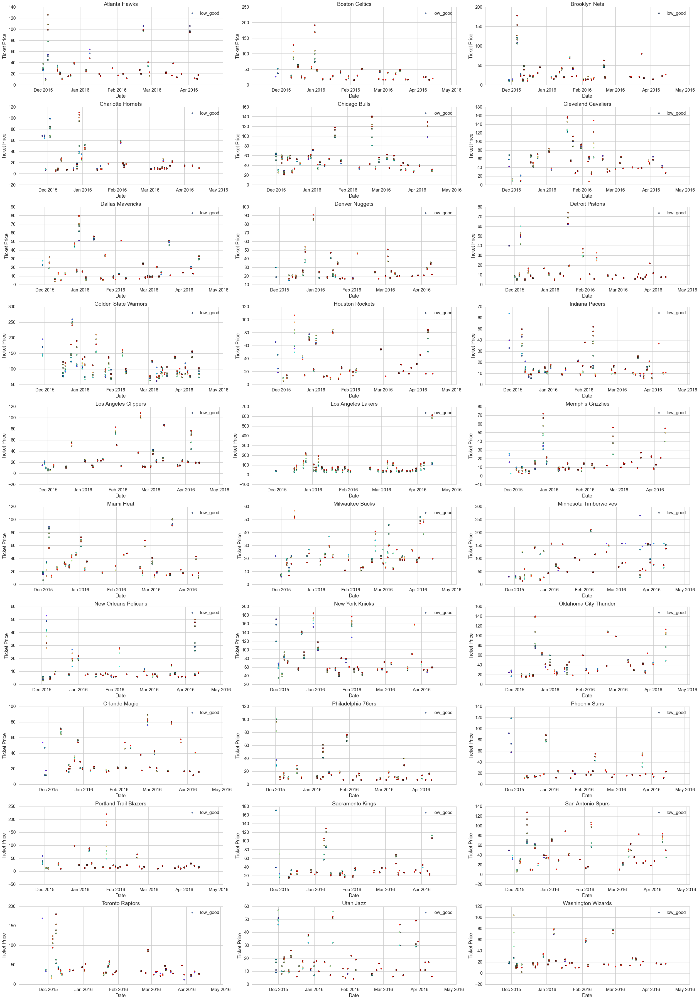

In [45]:
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(35, 50), tight_layout=True)

for ax, team in zip(axes.ravel(), tickets.groupby('home_team')):
    #establish a figure
    plt.figure()
    #ax.scatter(team[1]['dateutc'].values, team[1]['avg_price'].values, alpha=1,  c=np.linspace(0,10,len(team[1])), cmap='rainbow', label='avg')
    ax.scatter(team[1]['dateutc'].values, team[1]['lowest_price_good_deal'].values, alpha=1, c=np.linspace(0,10,len(team[1])), cmap='rainbow',  label='low_good')
    #ax.scatter(team[1]['dateutc'].values, team[1]['lowest_price'].values, alpha=0.5, c=np.linspace(0,10,len(team[1])), cmap='rainbow', label='min')
    ax.set_title(team[0])
    ax.legend(loc='best')
    ax.set_xlabel('Date')
    ax.set_ylabel('Ticket Price')

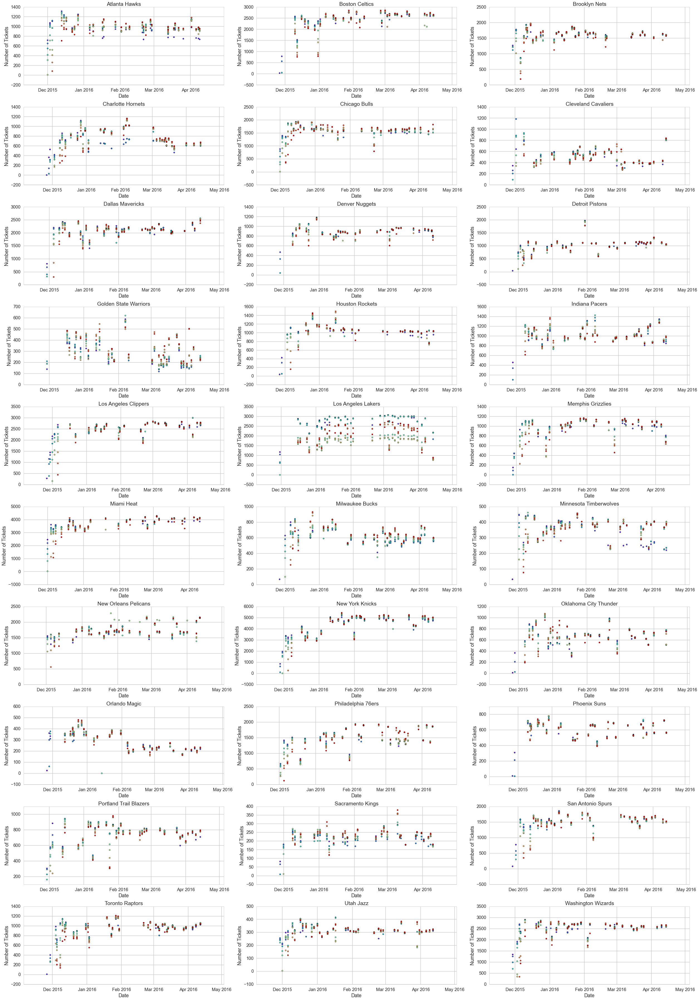

In [48]:
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(35, 50), tight_layout=True)

for ax, team in zip(axes.ravel(), tickets.groupby('home_team')):
    #establish a figure
    plt.figure()
    ax.scatter(team[1]['dateutc'].values, team[1]['listing_count'].values, c=np.linspace(0,10,len(team[1])), cmap='rainbow')

    ax.set_title(team[0])
    ax.set_xlabel('Date')
    ax.set_ylabel('Number of Tickets')

In [246]:
fulldf=pd.read_csv('cleanedFulldf.csv', index_col=0)
fulldf['dateutc'] = fulldf['dateutc'].astype('datetime64')
fulldf = fulldf.drop('dateutcindateform', 1)

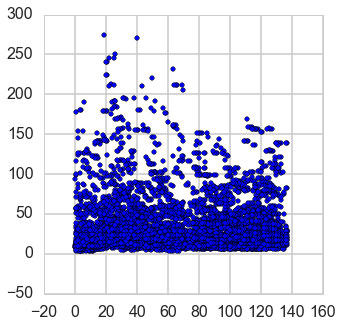

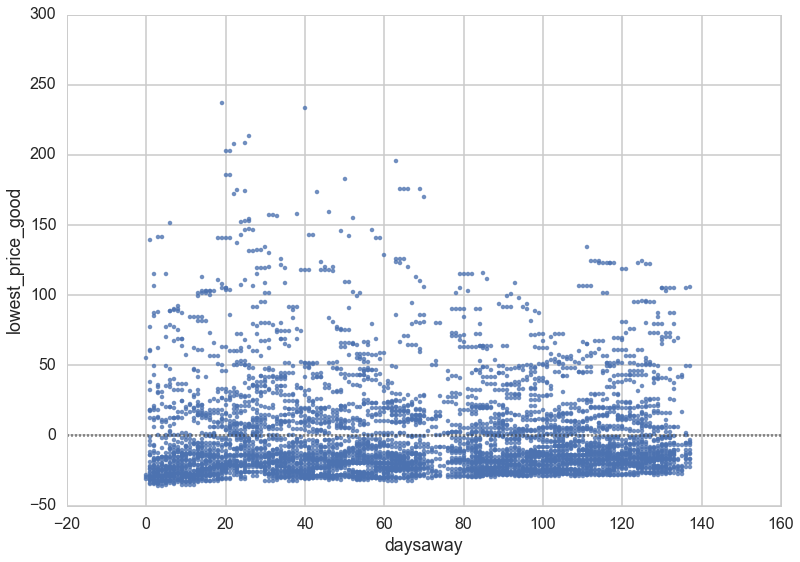

In [273]:
#effect of listing on ticket price
plt.figure(figsize=(5,5))
plt.scatter(fulldf[fulldf['lowest_price_good']<500]['daysaway'] ,fulldf[fulldf['lowest_price_good']<500]['lowest_price_good'])
# plt.xlabel("Listing Count")
# plt.ylabel("Lowest Good Price")
# plt.title("Listing Count vs. Lowest Good Price")
plt.show()
sns.residplot("daysaway", "lowest_price_good", data=fulldf[fulldf['lowest_price_good']<500])

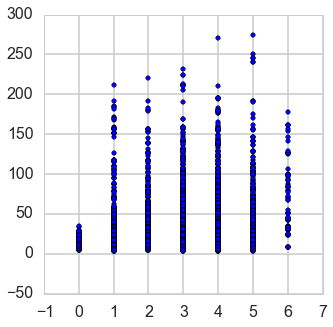

In [271]:
#effect of listing on ticket price
plt.figure(figsize=(5,5))
plt.scatter(fulldf[fulldf['lowest_price_good']<500]['cntStars_home']+fulldf[fulldf['lowest_price_good']<500]['cntStars_away'] ,fulldf[fulldf['lowest_price_good']<500]['lowest_price_good'])
# plt.xlabel("Listing Count")
# plt.ylabel("Lowest Good Price")
# plt.title("Listing Count vs. Lowest Good Price")
plt.show()

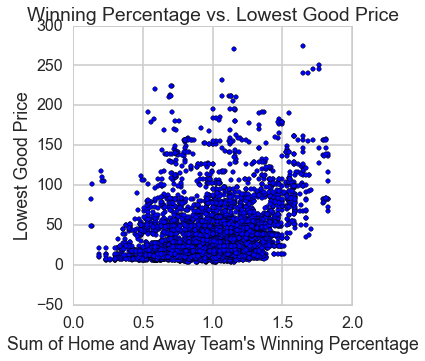

In [274]:
#effect of listing on ticket price
plt.figure(figsize=(5,5))
plt.scatter(fulldf[fulldf['lowest_price_good']<500]['WPCT_home']+fulldf[fulldf['lowest_price_good']<500]['WPCT_away'] ,fulldf[fulldf['lowest_price_good']<500]['lowest_price_good'])
plt.xlabel("Sum of Home and Away Team's Winning Percentage")
plt.ylabel("Lowest Good Price")
plt.title("Winning Percentage vs. Lowest Good Price")
plt.show()

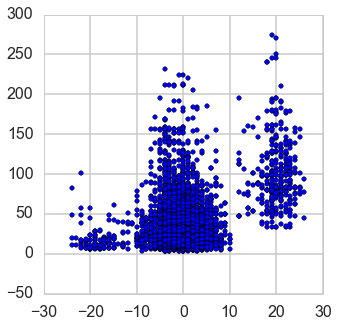

In [260]:
#effect of listing on ticket price
plt.figure(figsize=(5,5))
plt.scatter(fulldf[fulldf['lowest_price_good']<500]['STRK_home']+fulldf[fulldf['lowest_price_good']<500]['STRK_away'] ,fulldf[fulldf['lowest_price_good']<500]['lowest_price_good'])

# plt.xlabel("Listing Count")
# plt.ylabel("Lowest Good Price")
# plt.title("Listing Count vs. Lowest Good Price")
plt.show()

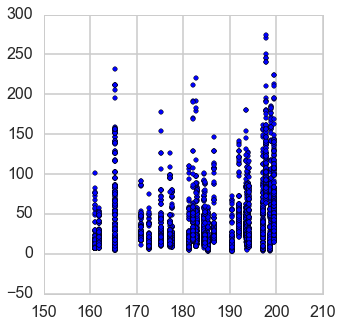

In [261]:
#effect of listing on ticket price
plt.figure(figsize=(5,5))
plt.scatter(fulldf[fulldf['lowest_price_good']<500]['HomePCT']+fulldf[fulldf['lowest_price_good']<500]['AwayPCT'] ,fulldf[fulldf['lowest_price_good']<500]['lowest_price_good'])
# plt.xlabel("Listing Count")
# plt.ylabel("Lowest Good Price")
# plt.title("Listing Count vs. Lowest Good Price")
plt.show()

In [252]:
fulldf.head(2)

,listing_count,avg_price,lowest_price_good,lowest_price,highest_price,city,venuename,venuescore,ticket_score,id,home_team,away_team,hometeamscore,awayteamscore,dateutc,daysaway,dateloaded,cntStars_home,WPCT_home,STRK_home,rankNBA_home,cntStars_away,WPCT_away,STRK_away,rankNBA_away,HomeAVG,HomePCT,AwayAVG,AwayPCT,TotalAVG,TotalPCT,Population,numTeams,holiday,weekday
0,815,62,20,20,1800,Miami,American Airlines Arena,0.85776,0.78884,2759732,Miami Heat,Boston Celtics,0.78556,0.74908,2015-12-01,2,2015-11-29,2,0.667,1,5,0,0.563,2,12,19659,100.3,16840,84.2,18720,94.9,5764000,4,0,Tuesday
1,3431,146,49,49,6505,Miami,American Airlines Arena,0.85776,0.84152,2759651,Miami Heat,Brooklyn Nets,0.78556,0.75524,2015-12-29,30,2015-11-29,2,0.667,1,5,3,0.188,-2,28,19659,100.3,16840,84.2,18720,94.9,5764000,4,0,Tuesday


#V Final Analysis: 

What did you learn about the data? How did you answer the questions? How can you justify your answers?


ridge regression showed the best result
 borrow explanantion from pset

